In [3]:
import numpy as np
import pandas as pd 
import geopandas as gpd
import matplotlib.pyplot as plt
import osmnx as ox
import networkx as nx
from descartes import PolygonPatch
from shapely.geometry import Point, Polygon, MultiPolygon, LineString
from tqdm.auto import tqdm
import shapely.speedups
shapely.speedups.enable() 
import warnings
warnings.filterwarnings('ignore')

In [4]:
PLACE_NAME = 'karlsruhe, Germany'
name = 'karlsruhe'
grid_size = 500

epsg:4326
+proj=utm +zone=32 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs
<class 'shapely.geometry.polygon.Polygon'>


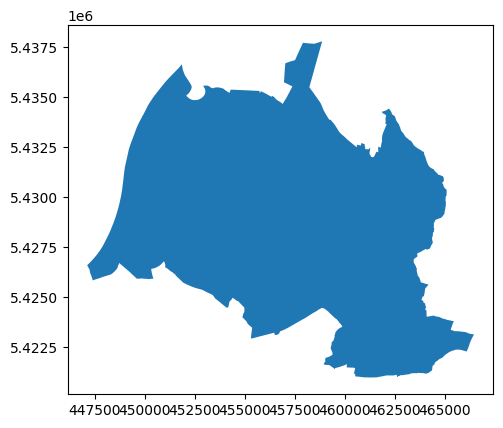

In [5]:
city = ox.geocode_to_gdf(PLACE_NAME)
print(city.crs)
## changing CRS for grid division
city = ox.project_gdf(city) 
print(city.crs)
ax = city.plot()
geometry = city['geometry'].iloc[0]
print(type(geometry))

In [6]:
#save geometry
city.to_file(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}.shp")

#### Division into grid

In [7]:
geometry_cut = ox.utils_geo._quadrat_cut_geometry(geometry, quadrat_width=grid_size) #500 Meter grid
print(type(geometry_cut))
polylist = [poly for poly in geometry_cut.geoms]

<class 'shapely.geometry.multipolygon.MultiPolygon'>


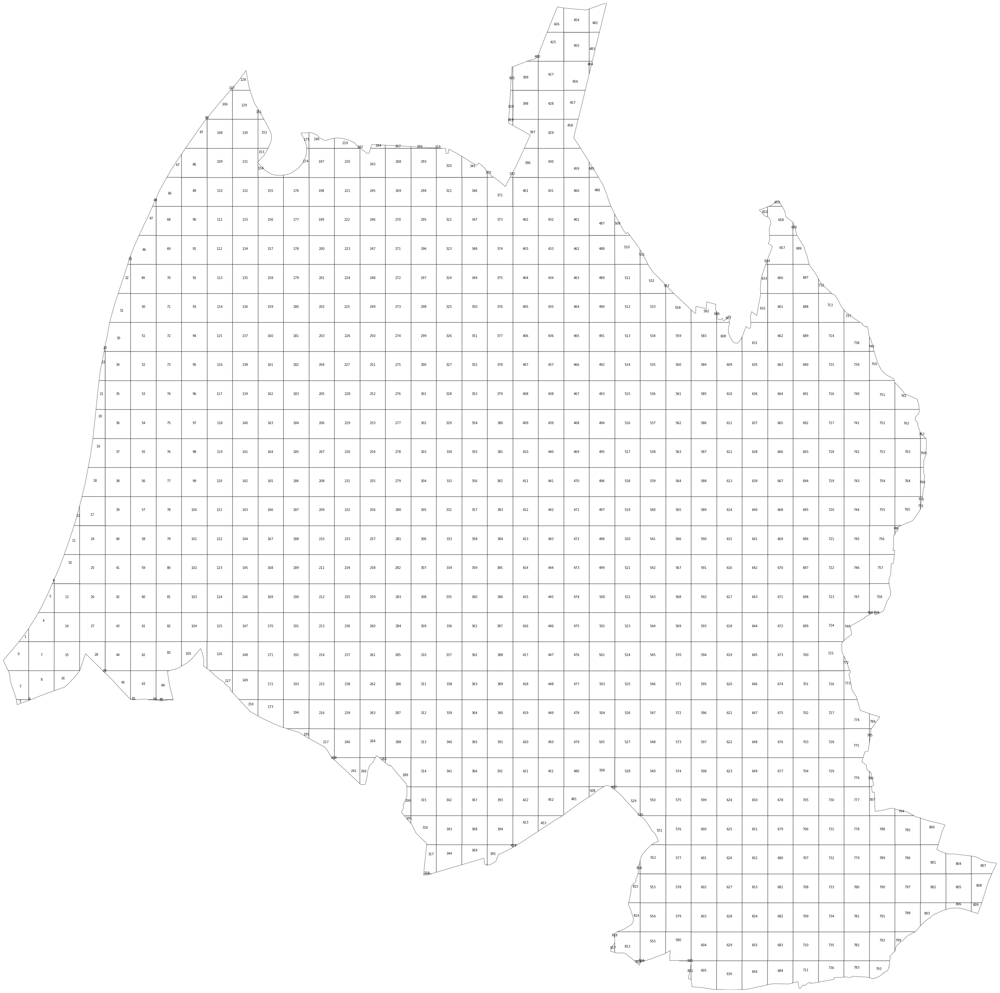

In [8]:
polylist = [poly for poly in geometry_cut.geoms]
# plot city
west, south, east, north = city.unary_union.bounds

fig, ax = plt.subplots(figsize=(40,40))
for polygon, n in zip(geometry_cut.geoms, np.arange(len(polylist))):
    p = polygon.representative_point().coords[:][0]
    patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', alpha=0.5, zorder=2)
    ax.add_patch(patch)
    plt.annotate(text=n, xy=p, horizontalalignment='center', size=7)
    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

In [9]:
city_polyframe = gpd.GeoDataFrame(geometry=polylist)
city_polyframe.crs = city.crs
print(city_polyframe.crs)
city_polyframe.head()

+proj=utm +zone=32 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs


,geometry
0,"POLYGON ((447130.394 5426579.598, 447310.886 5..."
1,"POLYGON ((447437.314 5426896.734, 447446.362 5..."
2,"POLYGON ((447625.878 5426403.113, 447625.878 5..."
3,"POLYGON ((447625.878 5425909.491, 447625.878 5..."
4,"POLYGON ((447625.878 5427121.103, 447786.201 5..."


(6264766.411446367, 6290364.562755316)

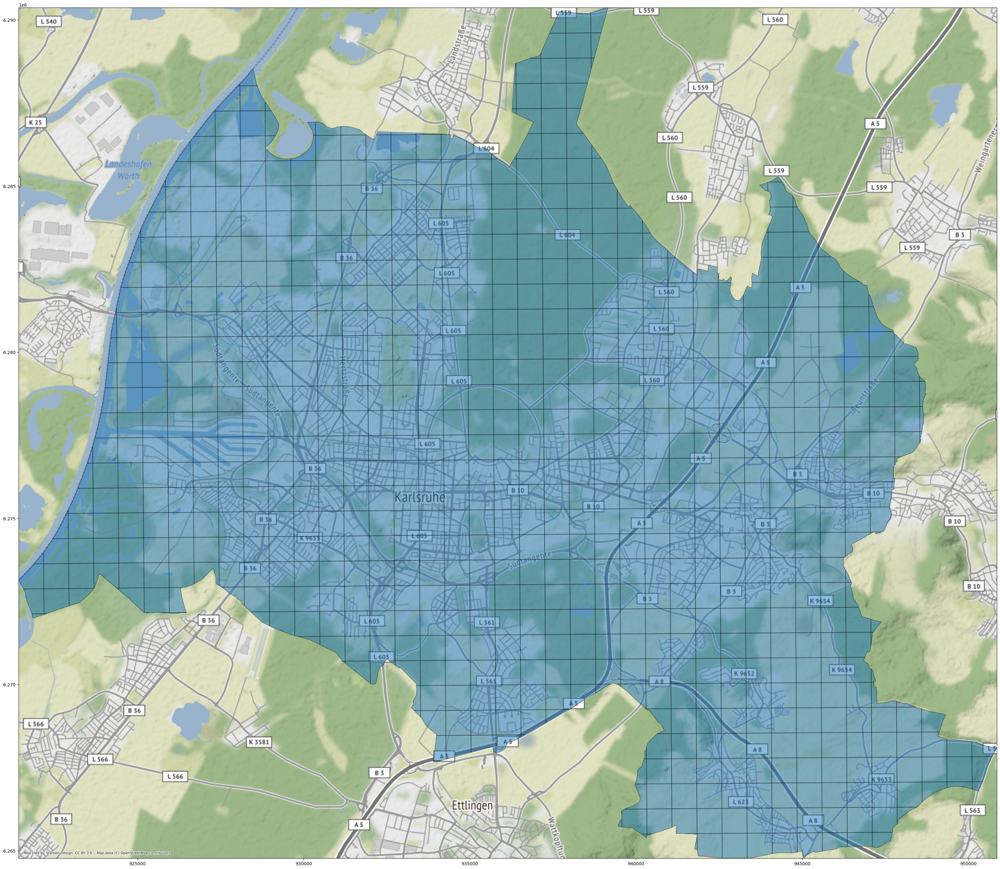

In [10]:
import contextily as ctx
# ctx uses epsg:3857ax = city.plot()
polyframe_3857 = city_polyframe.to_crs(epsg=3857)
west, south, east, north = polyframe_3857.unary_union.bounds

ax = polyframe_3857.plot(figsize=(40,40), alpha=0.5, edgecolor='k')
ctx.add_basemap(ax, zoom=13)
ax.set_xlim(west, east)
ax.set_ylim(south, north)

#### POIs
- Understanding each one of them and making dataset

In [11]:
city_polyframe_lat_long = ox.project_gdf(city_polyframe, to_latlong=True) #Changing CRS to (Lat, long)
city_polyframe_lat_long.head()

,geometry
0,"POLYGON ((8.27731 48.98985, 8.27976 48.99149, ..."
1,"POLYGON ((8.28147 48.99273, 8.28159 48.99282, ..."
2,"POLYGON ((8.28411 48.98831, 8.28417 48.98387, ..."
3,"POLYGON ((8.28417 48.98387, 8.28417 48.98375, ..."
4,"POLYGON ((8.28402 48.99477, 8.28618 48.99678, ..."


##### 1. EV stations

In [12]:
EV_stations = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "charging_station"},
)
EV_stations.head()
EV_stations.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-EV_stations.csv")

Text(0.5, 1.0, 'Berlin EV stations')

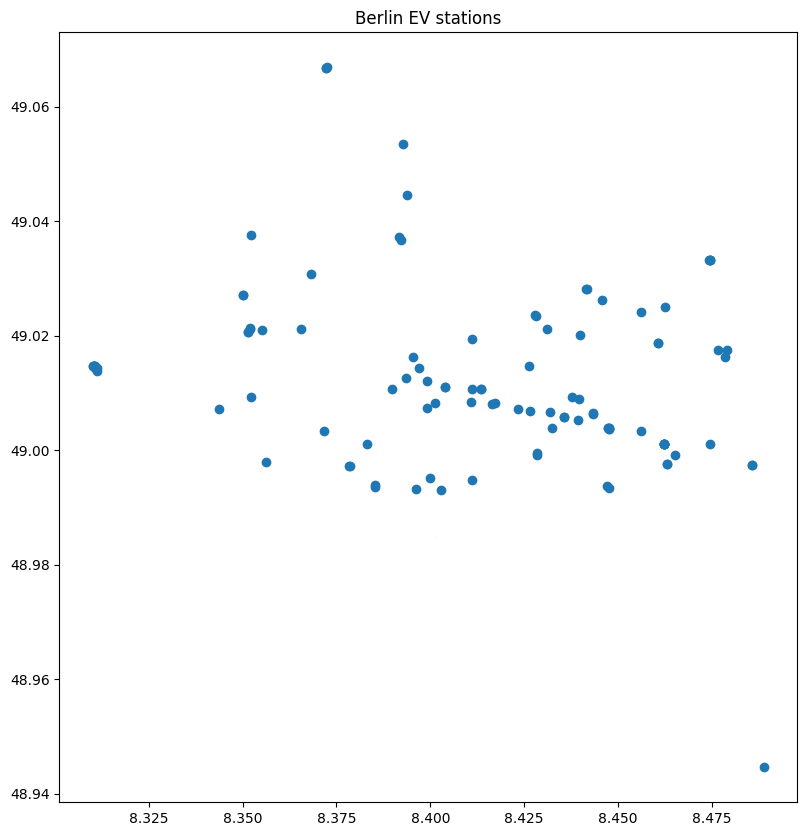

In [13]:
#plot EV stations geo data
EV_stations.plot(figsize=(10,10))
plt.title("Berlin EV stations")

Text(0.5, 1.0, 'Berlin EV stations')

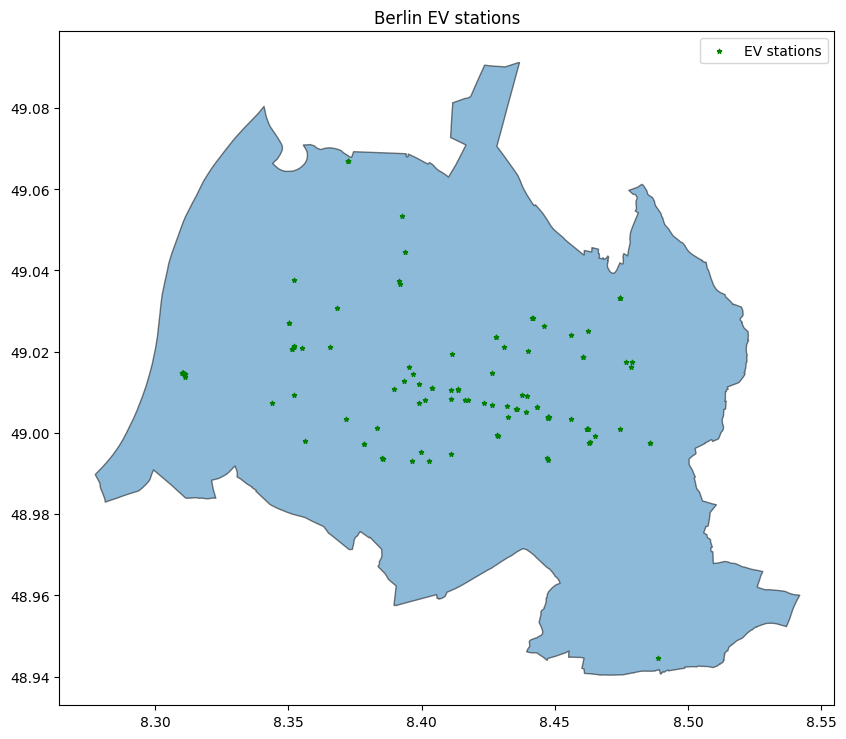

In [14]:
fig, ax = plt.subplots(figsize=(10,10))
ox.project_gdf(city, to_latlong=True).plot(ax =ax, alpha=0.5, edgecolor='k')
EV_stations.plot(ax=ax, color='green', marker='*', markersize=10)
#add legend
plt.legend(['EV stations'])
plt.title("Berlin EV stations")

In [15]:
list(EV_stations.columns)

['amenity',
 'amperage',
 'authentication:membership_card',
 'bicycle',
 'capacity',
 'fee',
 'motorcar',
 'note',
 'old_ref',
 'opening_hours',
 'operator',
 'payment:enbw_elektronautenkarte',
 'ref',
 'scooter',
 'socket:type2',
 'voltage',
 'geometry',
 'access',
 'authentication:intercharge',
 'operator:wikidata',
 'operator:wikipedia',
 'payment:intercharge',
 'socket:type2:output',
 'description',
 'truck',
 'charging_station:plug',
 'network',
 'socket:schuko',
 'level',
 'socket',
 'lastcheck',
 'authentication:nfc',
 'brand',
 'check_date',
 'payment:app',
 'payment:contactless',
 'short_ref',
 'emergency',
 'fixme',
 'highway',
 'man_made',
 'monitoring:air_quality',
 'monitoring:humidity',
 'monitoring:noise',
 'monitoring:temperature',
 'name',
 'start_date',
 'wifi',
 'layer',
 'capacity:private',
 'not:operator:wikidata',
 'authentication:none',
 'maxstay',
 'parking:fee',
 'manufacturer',
 'model',
 'socket:type2_combo',
 'socket:type2_combo:output',
 'internet_access',


In [16]:
assert np.sum(EV_stations['amenity'].values == 'charging_station') ==  len(EV_stations) #amenity column
### investigating important columns
EV_stations['geometry'].head() #geometry column

element_type  osmid     
node          25397898      POINT (8.43105 49.02119)
              1395867922    POINT (8.42350 49.00725)
              1507190213    POINT (8.41099 49.01065)
              1633986517    POINT (8.37850 48.99716)
              1711052995    POINT (8.46517 48.99923)
Name: geometry, dtype: geometry

In [18]:
#check null values out of toital values
# print(EV_stations['amperage'].isnull().sum() / len(EV_stations)) #amperage column
# print(EV_stations['voltage'].isnull().sum() / len(EV_stations)) #voltage column
# print(EV_stations['capacity'].isnull().sum() / len(EV_stations)) #capacity column
# print(EV_stations['socket:type2'].isnull().sum() / len(EV_stations)) #socket column
# #output column
# print(EV_stations['output'].isnull().sum() / len(EV_stations)) #output column
# #parking column
# print(EV_stations['parking'].isnull().sum() / len(EV_stations)) #parking column
#charging_station:output column

In [19]:
#intersection of points and polygons
import shapely.speedups
shapely.speedups.enable() 

masks_EV = []
for i in tqdm(range(0,city_polyframe.shape[0])):
    pip_mask = EV_stations.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_EV.append(pip_mask)

/tmp/ipykernel_26961/3985573752.py:3: DeprecationWarning: This function has no longer any effect, and will be removed in a future release. Starting with Shapely 2.0, equivalent speedups are always available
  shapely.speedups.enable()
100%|██████████| 822/822 [00:00<00:00, 47189.58it/s]


In [21]:
#extract ['amperage', 'voltage', 'amenity', 'capacity'] columns
# EV_stations[masks_EV[1438]][['amperage', 'voltage', 'amenity', 'capacity', 'geometry']]

In [22]:
#EV stations in the 3022 grid (example)
# EV_stations[masks_EV[3022]][['amperage', 'voltage', 'amenity', 'capacity', 'geometry']]

In [23]:
# create a new geodataframe with mask EV stations 
EV_stations_masked = gpd.GeoDataFrame()
for i in tqdm(range(0,city_polyframe.shape[0])):
    EV_stations_masked = pd.concat([EV_stations_masked, EV_stations[masks_EV[i]][['geometry']]], ignore_index=True)

100%|██████████| 822/822 [00:01<00:00, 578.90it/s]


In [24]:
# EV_stations[masks_EV[1438]]['amperage'].values.tolist()

In [25]:
berlin_polyframe_lat_long_new = city_polyframe_lat_long.copy()
berlin_polyframe_lat_long_new['EV_stations_counts'] = 0
# berlin_polyframe_lat_long_new['EV_stations_aperage'] = 0
# berlin_polyframe_lat_long_new['EV_stations_voltage'] = 0
# berlin_polyframe_lat_long_new['EV_stations_capacity'] = 0
berlin_polyframe_lat_long_new['EV_stations_geomery'] = 0

In [26]:
for i in tqdm(range(0,berlin_polyframe_lat_long_new.shape[0])):
    berlin_polyframe_lat_long_new.loc[i, 'EV_stations_counts'] = EV_stations[masks_EV[i]].shape[0]
    # berlin_polyframe_lat_long_new.loc[i, 'EV_stations_aperage'] = str(EV_stations[masks_EV[i]][['amperage']].values.tolist())
    # berlin_polyframe_lat_long_new.loc[i, 'EV_stations_voltage'] = str(EV_stations[masks_EV[i]][['voltage']].values.tolist())
    # berlin_polyframe_lat_long_new.loc[i, 'EV_stations_capacity'] = str(EV_stations[masks_EV[i]][['capacity']].values.tolist())
    berlin_polyframe_lat_long_new.loc[i, 'EV_stations_geomery'] = str(EV_stations[masks_EV[i]][['geometry']].values.tolist())

100%|██████████| 822/822 [00:01<00:00, 542.40it/s]


In [27]:
#How many EV stations in each grid
berlin_polyframe_lat_long_new['EV_stations_counts'].value_counts()
#Percentage of EV stations in each grid
berlin_polyframe_lat_long_new['EV_stations_counts'].value_counts() / berlin_polyframe_lat_long_new.shape[0]

EV_stations_counts
0    0.928224
1    0.040146
2    0.015815
3    0.008516
4    0.003650
8    0.001217
6    0.001217
7    0.001217
Name: count, dtype: float64

##### Population data visualize and add to each grid

In [28]:
#### Extract population data
df_pop = pd.read_csv("//home/akansh-i2sc/Downloads/Compressed/population_deu_2019-07-01.csv")
gdf = gpd.GeoDataFrame(df_pop, geometry=gpd.points_from_xy(df_pop.Lon, df_pop.Lat))

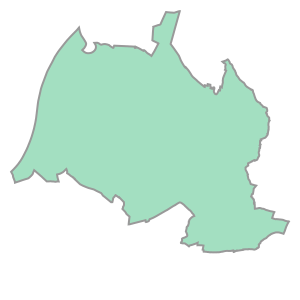

In [29]:
#extract population data for berlin
city.geometry[0]

In [30]:
# change crs to lat long
city_lat_long = ox.project_gdf(city, to_latlong=True)
pip_mask = gdf.within(city_lat_long.loc[0, 'geometry']) 

In [31]:
berlin_pop_gdf = gdf.loc[pip_mask]

<Axes: >

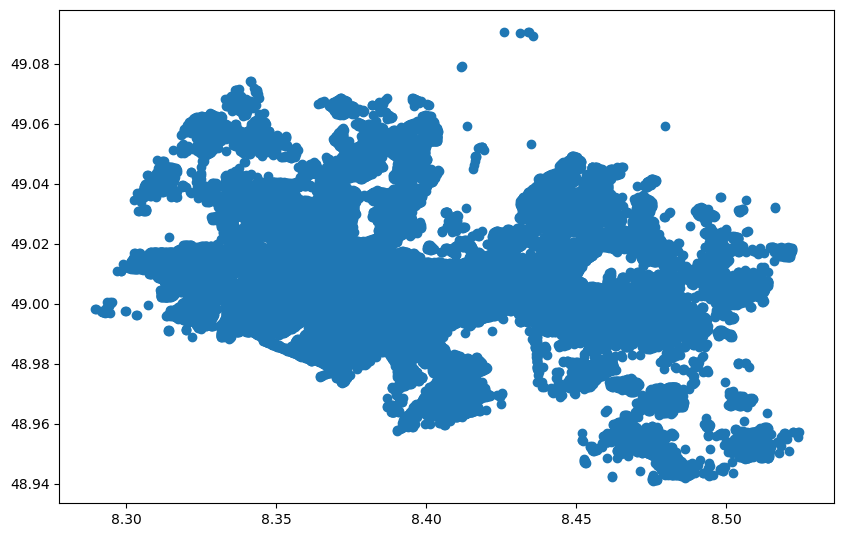

In [32]:
#plot population data with cmap
berlin_pop_gdf.plot(figsize=(10,10))

In [33]:
berlin_pop_gdf.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-population.csv")

In [34]:
# population for each grid
masks_pop = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = berlin_pop_gdf.within(city_polyframe_lat_long.loc[i, 'geometry'])
    masks_pop.append(pip_mask)

100%|██████████| 822/822 [00:00<00:00, 1050.96it/s]


In [35]:
pop_grid = []
for i in range(0,city_polyframe_lat_long.shape[0]):
    pop_grid.append(berlin_pop_gdf.loc[masks_pop[i]].Population.mean())

In [36]:
pop_grid = np.nan_to_num(pop_grid)

In [37]:
berlin_polyframe_lat_long_new['population'] = pop_grid
berlin_polyframe_lat_long_new.head()

,geometry,EV_stations_counts,EV_stations_geomery,population
0,"POLYGON ((8.27731 48.98985, 8.27976 48.99149, ...",0,[],0.0
1,"POLYGON ((8.28147 48.99273, 8.28159 48.99282, ...",0,[],0.0
2,"POLYGON ((8.28411 48.98831, 8.28417 48.98387, ...",0,[],0.0
3,"POLYGON ((8.28417 48.98387, 8.28417 48.98375, ...",0,[],0.0
4,"POLYGON ((8.28402 48.99477, 8.28618 48.99678, ...",0,[],0.0


/tmp/ipykernel_26961/793193480.py:9: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(['EV stations'])


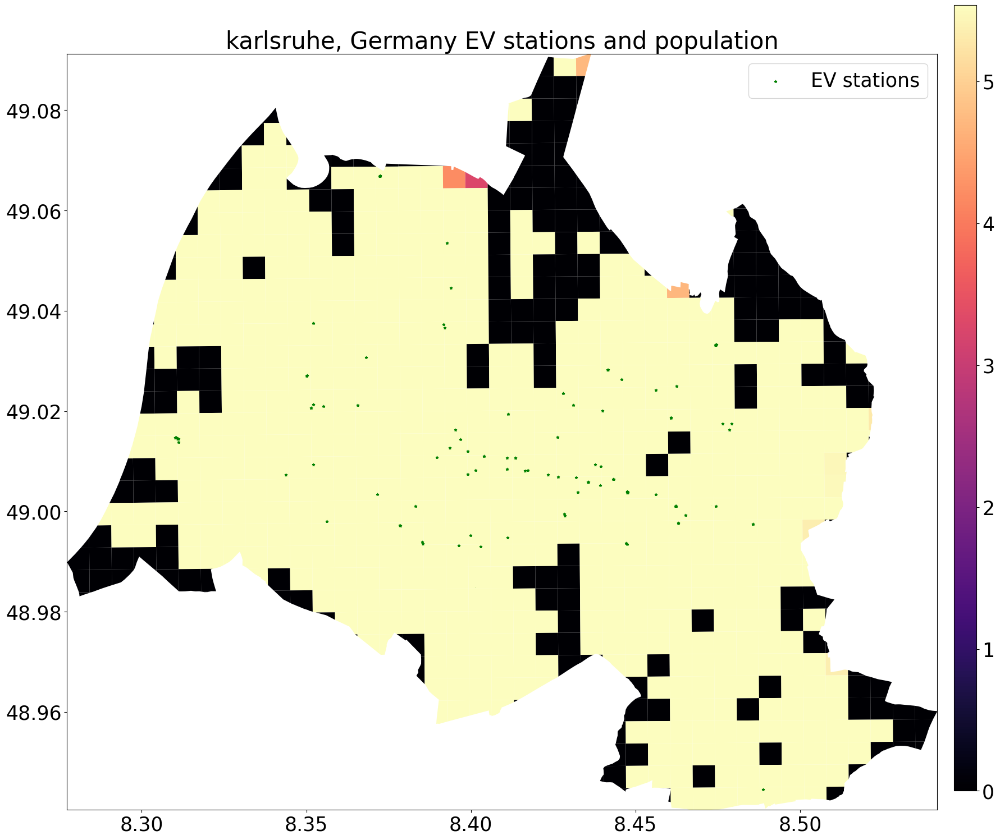

In [38]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'population', legend=False, cmap='magma')
# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')
# add legend
plt.legend(['EV stations'])
plt.title(f'{PLACE_NAME} EV stations and population')
cbax = fig.add_axes([0.915, 0.175, 0.02, 0.7])

sm = plt.cm.ScalarMappable(cmap='magma', \
                          norm = plt.Normalize(vmin=min(berlin_polyframe_lat_long_new.population), vmax=max(berlin_polyframe_lat_long_new.population)))
sm._A = []
# draw colormap into cbax
fig.colorbar(sm, cax=cbax, format="%d")
ax.set_xlim(west, east)
ax.set_ylim(south, north)
# ax.axis('off')30
plt.show()

##### LAnd_USE 

In [39]:
landuse = ox.geometries_from_place(PLACE_NAME, tags={'landuse': True})

# Define the categories
categories = {
    'residential': ['residential'],
    'commercial': ['commercial', 'retail', 'office', 'industrial'],
    'retail': ['retail'],
    'industrial': ['industrial']
}

# Create a new column to categorize the landuse types
landuse['category'] = 'Other'

# Iterate through the categories and assign the corresponding landuse types
for category, tags in categories.items():
    landuse.loc[landuse['landuse'].isin(tags), 'category'] = category

In [40]:
landuse.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-landuse.csv")

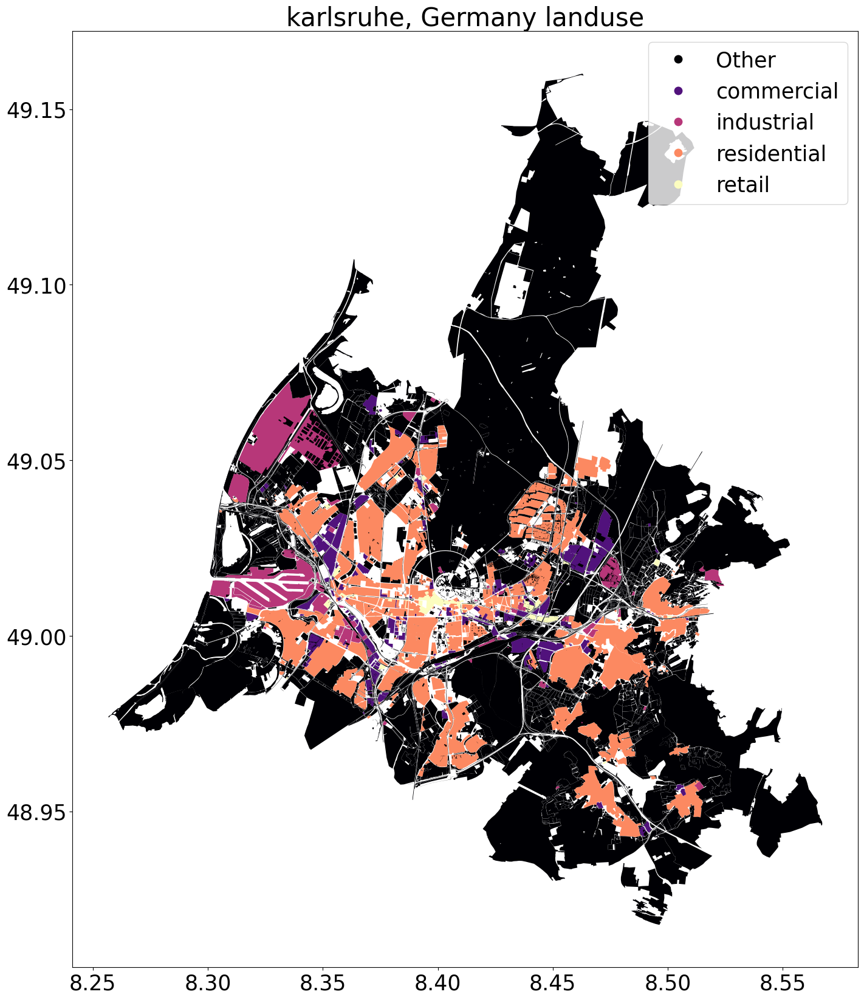

In [41]:
#plot node in landuse
fig, ax = plt.subplots(figsize=(20,20))
landuse.plot(ax=ax, column = 'category', legend=True, cmap='magma')
plt.title(f'{PLACE_NAME} landuse')
plt.show()

In [42]:
#create a copy of landuse drop everything except Category and geometry
landuse_cat = landuse[['category', 'geometry']].copy()

In [43]:
import shapely.speedups
shapely.speedups.enable()

/tmp/ipykernel_26961/3808896212.py:2: DeprecationWarning: This function has no longer any effect, and will be removed in a future release. Starting with Shapely 2.0, equivalent speedups are always available
  shapely.speedups.enable()


In [44]:
masks_land_use = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = landuse_cat.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_land_use.append(pip_mask)
    assert pip_mask.shape[0] == landuse_cat.shape[0]

100%|██████████| 822/822 [00:00<00:00, 3897.42it/s]


In [45]:
land_labels = []
for i in range(0,city_polyframe_lat_long.shape[0]):
    if landuse_cat[masks_land_use[i]].category.value_counts().isnull().all() == True:
        land_labels.append('Other')
    else:
        land_labels.append(landuse_cat[masks_land_use[i]].category.value_counts().index[0])

In [46]:
berlin_polyframe_lat_long_new['landuse'] = land_labels

In [47]:
berlin_polyframe_lat_long_new.landuse.value_counts()

landuse
Other          799
industrial      13
residential      7
commercial       2
retail           1
Name: count, dtype: int64

/tmp/ipykernel_26961/2740752356.py:8: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


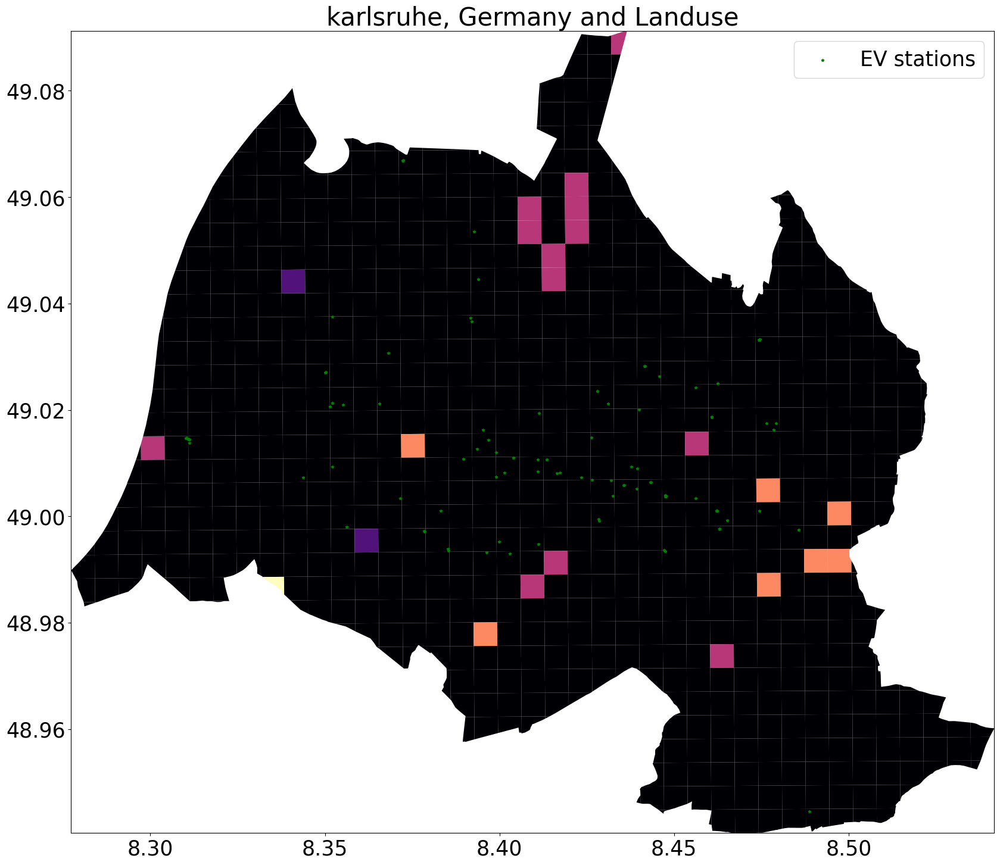

In [48]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'landuse', legend=False, cmap='magma')
# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')
ax.legend()
# add legend
plt.title(f'{PLACE_NAME} and Landuse')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
# ax.axis('off')30
plt.show()

##### Raod Connectivity

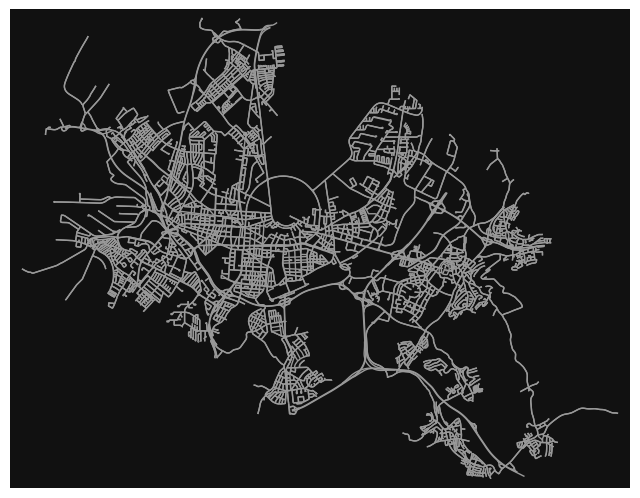

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [53]:
G = ox.graph_from_place(PLACE_NAME, network_type='drive')
ox.plot_graph(G, node_size= 0)

In [54]:
area,edges = ox.graph_to_gdfs(G)

In [55]:
# poly = city_polyframe_lat_long.loc[1254, 'geometry']
# G_1 = ox.graph_from_polygon(poly, network_type='drive')
# ox.plot_graph(G_1)

# #print number of nodes and edges and density
# print('Number of nodes in the graph: ', len(list(G_1.nodes())))
# print('Number of edges in the graph: ', len(list(G_1.edges())))
# print('Density of the graph: ', nx.density(G_1))

In [56]:
#calculate number of edges and nodes for each grid
nodes = []
edges = []
density = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    try: 
        poly = city_polyframe_lat_long.loc[i, 'geometry']
        G = ox.graph_from_polygon(poly, network_type='drive')
        nodes.append(len(list(G.nodes())))
        edges.append(len(list(G.edges())))
        density.append(nx.density(G))
    except:
        nodes.append(0)
        edges.append(0)
        density.append(0)


100%|██████████| 822/822 [06:53<00:00,  1.99it/s]


In [66]:
#add nodes, edges and density to the dataframe
berlin_polyframe_lat_long_new['nodes'] = nodes
berlin_polyframe_lat_long_new['edges'] = edges
berlin_polyframe_lat_long_new['density'] = density

In [67]:
#relation between EV stations and nodes


/tmp/ipykernel_26961/3231466269.py:11: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


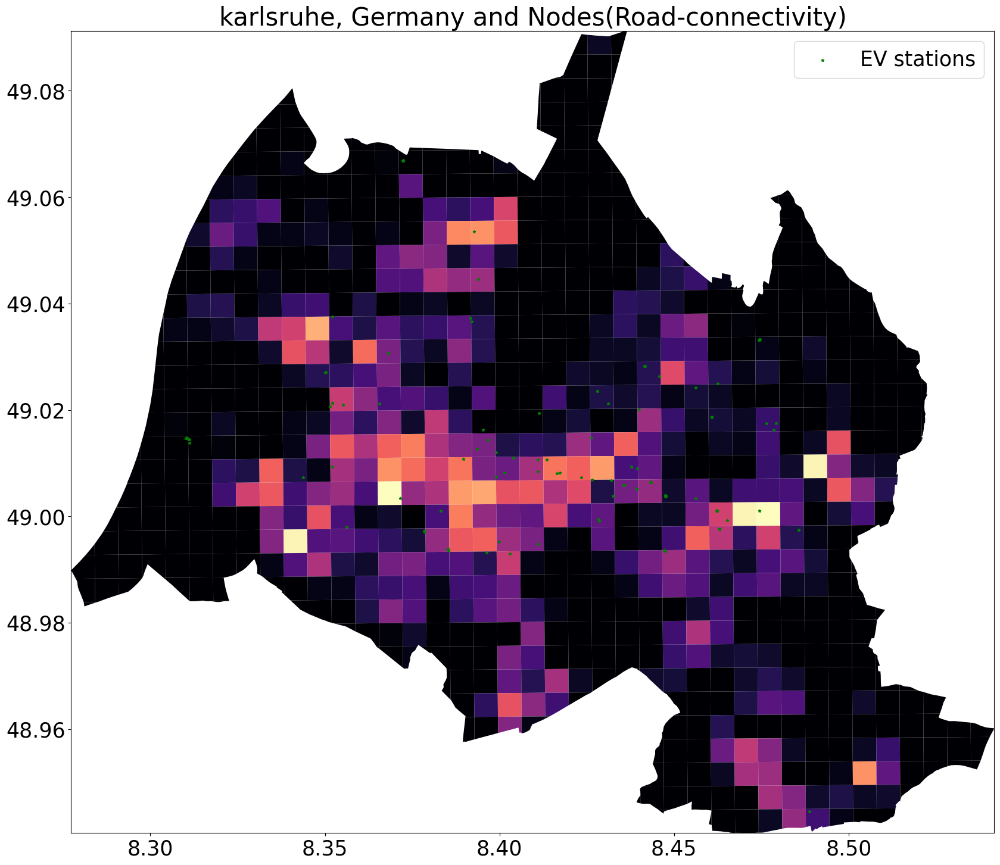

In [68]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

#nodes
fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'nodes', legend=False, cmap='magma')

# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')

ax.legend()
plt.title(f'{PLACE_NAME} and Nodes(Road-connectivity)')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.show()

/tmp/ipykernel_26961/2103950948.py:11: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


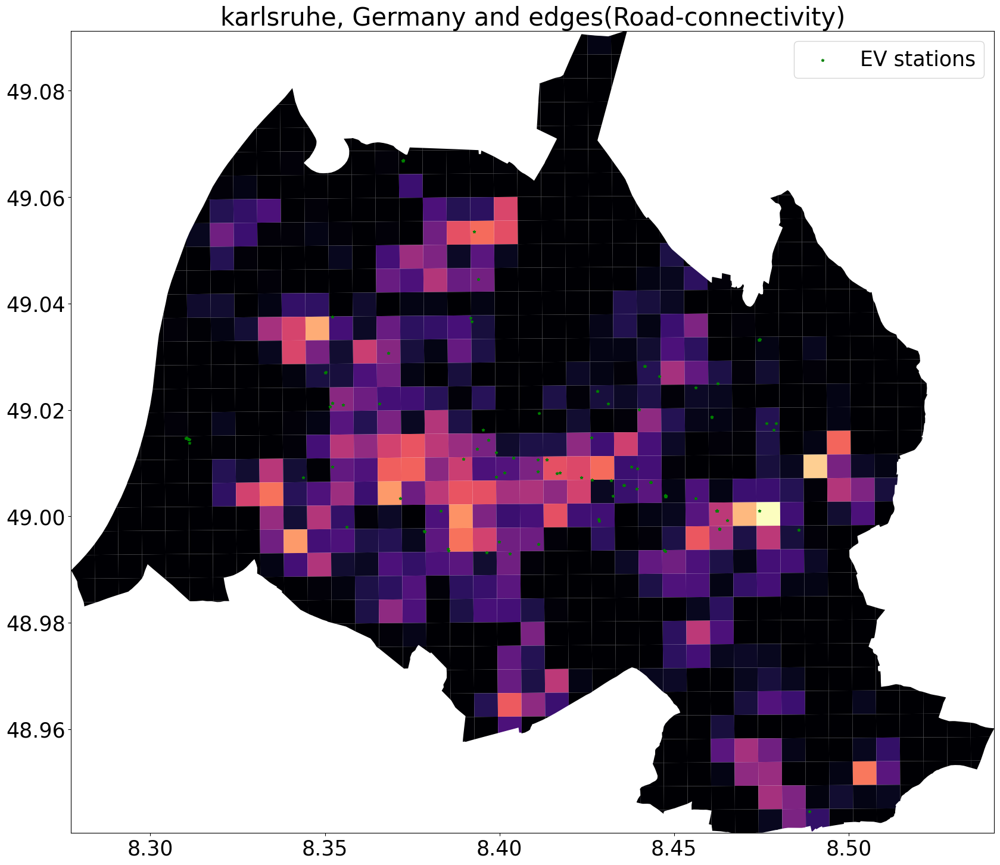

In [69]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

#nodes
fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'edges', legend=False, cmap='magma')

# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')

ax.legend()
plt.title(f'{PLACE_NAME} and edges(Road-connectivity)')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.show()

/tmp/ipykernel_26961/3099643536.py:11: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


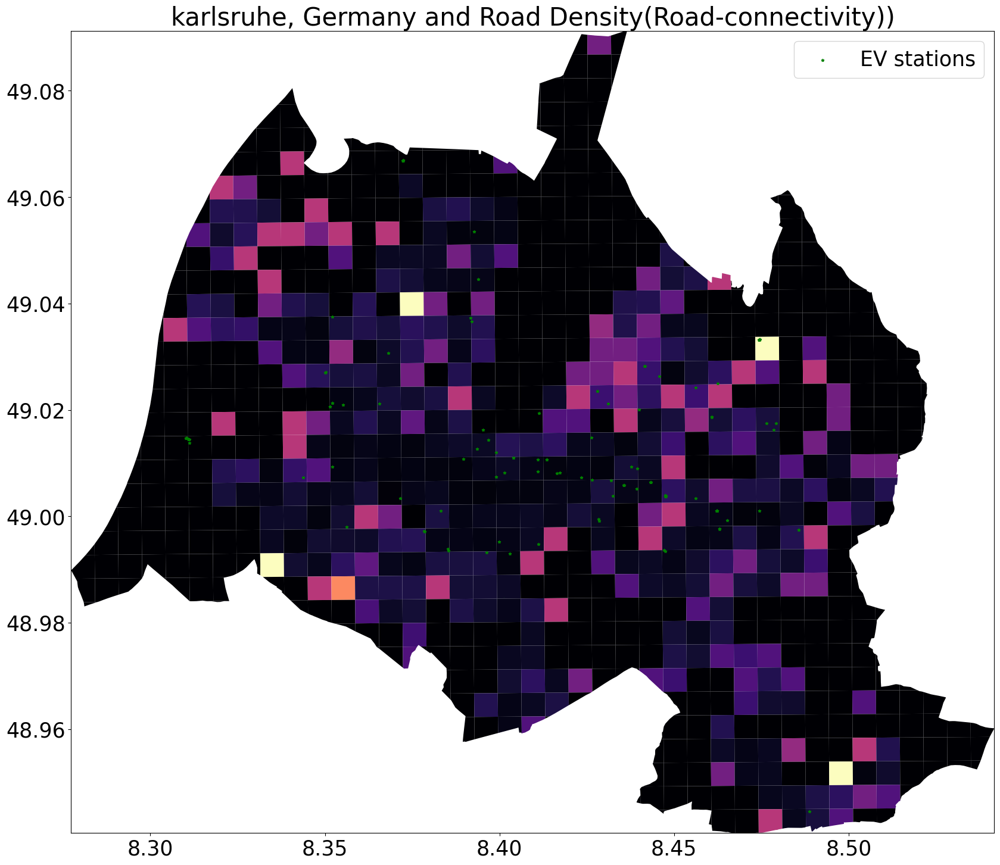

In [70]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

#nodes
fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'density', legend=False, cmap='magma')

# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')

ax.legend()
plt.title(f'{PLACE_NAME} and Road Density(Road-connectivity))')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.show()

##### Parking

In [71]:
parking = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "parking"},
)
parking.head()
parking.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-parking.csv")

<Axes: >

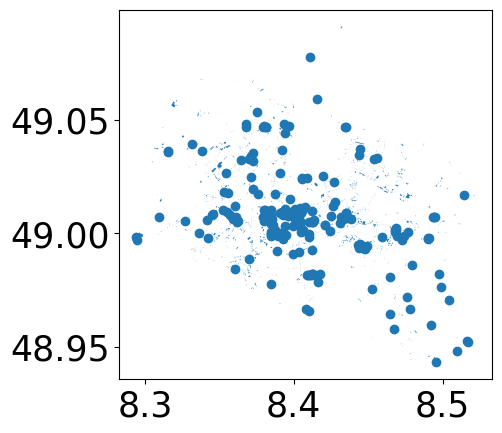

In [72]:
#parking spaces in the city
parking.plot()

In [73]:
#find parking spaces counts in the grid and their types
masks_parking = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = parking.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_parking.append(pip_mask)

100%|██████████| 822/822 [00:00<00:00, 11568.09it/s]


In [74]:
# parking[masks_parking[1032]].shape[0]

IndexError: list index out of range

In [75]:
#parking space counts and types to the dataframe
parking_count = []
parking_types = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    parking_count.append(parking[masks_parking[i]].shape[0])
    parking_types.append(parking[masks_parking[i]].parking.value_counts().to_dict())

100%|██████████| 822/822 [00:01<00:00, 690.90it/s]


In [76]:
berlin_polyframe_lat_long_new['parking_count'] = parking_count
berlin_polyframe_lat_long_new['parking_types'] = parking_types

/tmp/ipykernel_26961/874256832.py:12: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


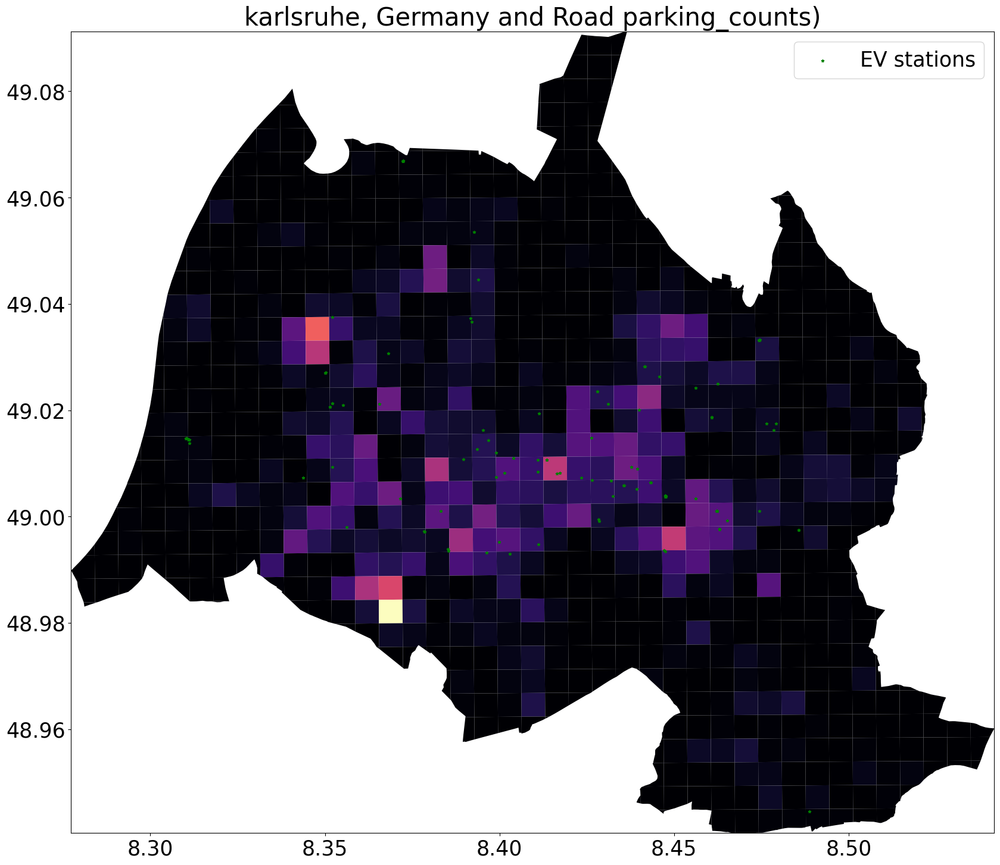

In [77]:
#relation between EV stations and parking spaces

plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'parking_count', legend=False, cmap='magma')

# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')

ax.legend()
plt.title(f'{PLACE_NAME} and Road parking_counts)')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.show()

In [78]:
#realation between EV stations and parking types
berlin_polyframe_lat_long_new[berlin_polyframe_lat_long_new['EV_stations_counts'] != 0].parking_types.value_counts()

#TO DO: PlOT the parking types with EV stations


parking_types
{}                                                                       4
{'surface': 2}                                                           4
{'surface': 7, 'street_side': 5}                                         2
{'surface': 4}                                                           2
{'street_side': 8, 'surface': 2}                                         2
{'surface': 1}                                                           2
{'surface': 5, 'multi-storey': 1}                                        1
{'street_side': 6, 'underground': 3, 'surface': 3, 'rooftop': 1}         1
{'surface': 8, 'street_side': 3, 'underground': 2}                       1
{'street_side': 6, 'surface': 5}                                         1
{'surface': 8, 'street_side': 3}                                         1
{'surface': 15, 'street_side': 4, 'underground': 2}                      1
{'surface': 6, 'underground': 2}                                         1
{'street_si

##### Resturants

In [79]:
restaurant = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "restaurant"},
)
restaurant.head()
restaurant.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-restaurant.csv")

<Axes: >

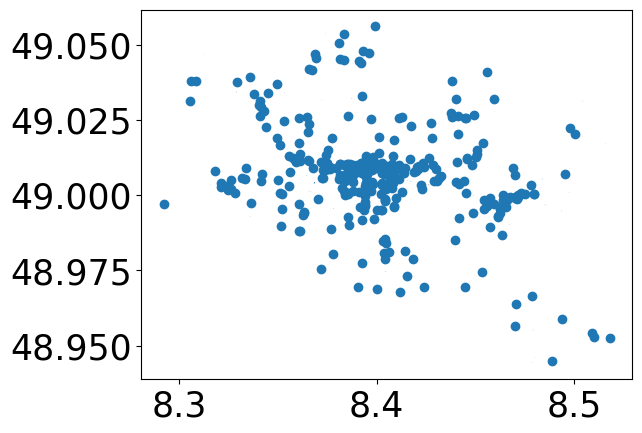

In [80]:
restaurant.plot()

In [81]:
list(restaurant.columns)

['addr:city',
 'addr:housenumber',
 'addr:postcode',
 'addr:street',
 'amenity',
 'cuisine',
 'name',
 'opening_hours',
 'opening_hours:covid19',
 'outdoor_seating',
 'phone',
 'website',
 'geometry',
 'opening_hours:signed',
 'wheelchair',
 'addr:country',
 'addr:suburb',
 'alt_name',
 'email',
 'beer_garden',
 'toilets:wheelchair',
 'contact:email',
 'contact:phone',
 'contact:website',
 'access:covid19',
 'brewery',
 'cuisine:description',
 'operator',
 'takeaway:covid19',
 'check_date',
 'kitchen_hours',
 'start_date',
 'note',
 'source:addr',
 'source',
 'addr:subdistrict',
 'takeaway',
 'kitchen',
 'check_date:opening_hours',
 'diet:vegan',
 'diet:vegetarian',
 'indoor_seating',
 'smoking',
 'toilets',
 'fixme',
 'delivery',
 'description',
 'contact:fax',
 'microbrewery',
 'note:en',
 'reg_name',
 'fax',
 'toilets:access',
 'internet_access',
 'internet_access:fee',
 'internet_access:ssid',
 'level',
 'created_by',
 'drive_in',
 'lunch',
 'lunch:warm',
 'old_name',
 'alt_name:no

In [82]:
#find resturants counts in the grid and their types
masks_restaurant = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = restaurant.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_restaurant.append(pip_mask)



100%|██████████| 822/822 [00:00<00:00, 31806.40it/s]


In [83]:
#resturant counts and capacity to the dataframe
restaurant_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    restaurant_count.append(restaurant[masks_restaurant[i]].shape[0])

100%|██████████| 822/822 [00:00<00:00, 1473.96it/s]


In [84]:
berlin_polyframe_lat_long_new['restaurant_count'] = restaurant_count

/tmp/ipykernel_26961/3766938667.py:9: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(['EV stations'])


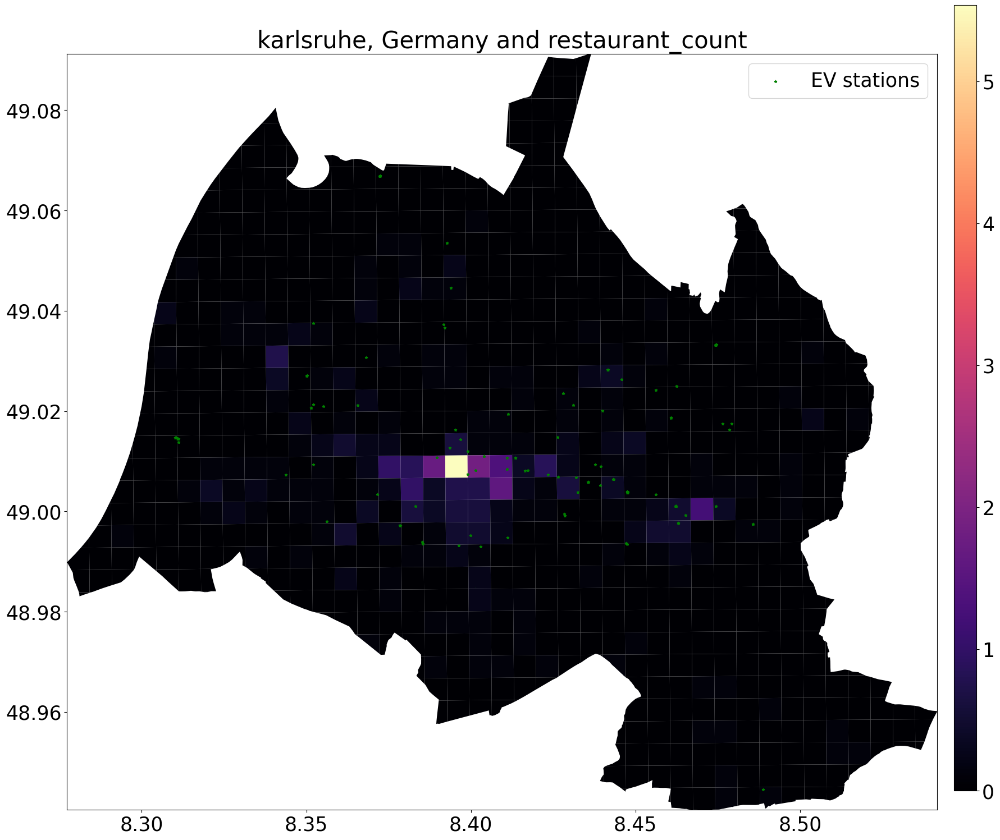

In [85]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'restaurant_count', legend=False, cmap='magma')
# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')
# add legend
plt.legend(['EV stations'])
plt.title(f'{PLACE_NAME} and restaurant_count')
cbax = fig.add_axes([0.915, 0.175, 0.02, 0.7])

sm = plt.cm.ScalarMappable(cmap='magma', \
                          norm = plt.Normalize(vmin=min(berlin_polyframe_lat_long_new.population), vmax=max(berlin_polyframe_lat_long_new.population)))
sm._A = []
# draw colormap into cbax
fig.colorbar(sm, cax=cbax, format="%d")
ax.set_xlim(west, east)
ax.set_ylim(south, north)
# ax.axis('off')30
plt.show()

##### library

In [86]:
#relation between EV stations and library
library = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "library"},
)
library.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-library.csv")
library.head()

addr:city addr:country addr:housenumber addr:postcode  \
element_type osmid                                                              
node         32535727   Karlsruhe           DE               21         76149   
             348003957  Karlsruhe          NaN              79a         76185   
             375688614  Karlsruhe          NaN               13         76229   
             375689534  Karlsruhe           DE               12         76139   
             375691054  Karlsruhe           DE               10         76133   

                              addr:street  amenity  \
element_type osmid                                   
node         32535727        Rubensstraße  library   
             348003957  Weinbrennerstraße  library   
             375688614        Kirchstraße  library   
             375689534     Neisser Straße  library   
             375691054         Karlstraße  library   

                                                                    name  \
element_type osmid                                                         
node         32535727                        Stadtteilbibliothek Neureut   
             348003957                      Stadtteilbibliothek Mühlburg   
             375688614                    Stadtteilbibliothek Grötzingen   
             375689534                     Stadtteilbibliothek Waldstadt   
             375691054  Kinder- und Jugendbibliothek im Prinz-Max-Palais   

                                                            opening_hours  \
element_type osmid                                                          
node         32535727      Mo-We 14:00-18:00; Fr 09:30-12:30, 14:00-17:00   
             348003957  Mo 13:00-18:00; Tu 14:00-18:00; We 10:00-15:00...   
             375688614  Mo 14:00-18:00; Tu 13:00-17:00; We off; Th 13:...   
             375689534  Mo, Tu, Fr 14:00-18:00; We 10:00-12:00, 14:00-...   
             375691054                  Tu-Fr 10:00-18:30; Sa 10:00-14:00   

                                                                  website  \
element_type osmid                                                          
node         32535727   https://stadtbibliothek.karlsruhe.de/stadtteil...   
             348003957                                                NaN   
             375688614                                                NaN   
             375689534  https://stadtbibliothek.karlsruhe.de/stadtteil...   
             375691054                                                NaN   

                       wheelchair  ... roof:shape source start_date max_level  \
element_type osmid                 ...                                          
node         32535727          no  ...        NaN    NaN        NaN       NaN   
             348003957    limited  ...        NaN    NaN        NaN       NaN   
             375688614        NaN  ...        NaN    NaN        NaN       NaN   
             375689534        NaN  ...        NaN    NaN        NaN       NaN   
             375691054        yes  ...        NaN    NaN        NaN       NaN   

                       min_level surveillance wheelchair:description indoor  \
element_type osmid                                                            
node         32535727        NaN          NaN                    NaN    NaN   
             348003957       NaN          NaN                    NaN    NaN   
             375688614       NaN          NaN                    NaN    NaN   
             375689534       NaN          NaN                    NaN    NaN   
             375691054       NaN          NaN                    NaN    NaN   

                       room alt_name  
element_type osmid                    
node         32535727   NaN      NaN  
             348003957  NaN      NaN  
             375688614  NaN      NaN  
             375689534  NaN      NaN  
             375691054  NaN      NaN  

[5 rows x 56 columns]

<Axes: >

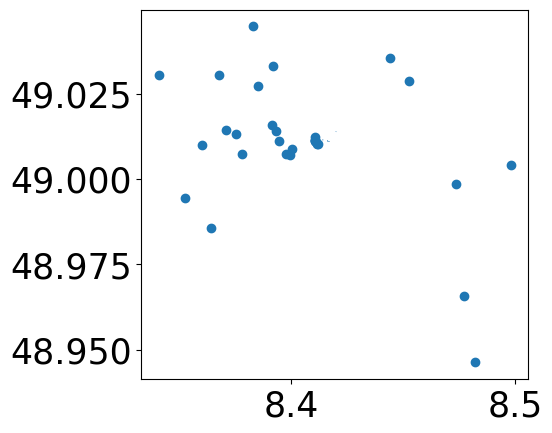

In [87]:
library.plot()

In [88]:
list(library.columns)

['addr:city',
 'addr:country',
 'addr:housenumber',
 'addr:postcode',
 'addr:street',
 'amenity',
 'name',
 'opening_hours',
 'website',
 'wheelchair',
 'geometry',
 'internet_access',
 'level',
 'check_date:opening_hours',
 'addr:housename',
 'addr:suburb',
 'note',
 'ref:isil',
 'short_name',
 'check_date',
 'access',
 'wikidata',
 'library',
 'operator',
 'ref',
 'university',
 'description',
 'toilets:wheelchair',
 'opening_hours:signed',
 'contact:email',
 'contact:fax',
 'contact:phone',
 'contact:website',
 'name:de',
 'name:en',
 'email',
 'wikipedia',
 'phone',
 'air_conditioning',
 'nodes',
 'architect',
 'building',
 'building:levels',
 'construction:start_date',
 'heritage',
 'name:sk',
 'roof:shape',
 'source',
 'start_date',
 'max_level',
 'min_level',
 'surveillance',
 'wheelchair:description',
 'indoor',
 'room',
 'alt_name']

In [89]:
# find library counts in the grid
masks_library = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = library.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_library.append(pip_mask)

#library counts to the dataframe
library_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    library_count.append(library[masks_library[i]].shape[0])

berlin_polyframe_lat_long_new['library_count'] = library_count

  0%|          | 0/822 [00:00<?, ?it/s]

100%|██████████| 822/822 [00:00<00:00, 1836.84it/s]


##### University

In [90]:
university = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "university"},
)
university.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-university.csv")
university.head()

geometry  \
element_type osmid                                                          
way          23855655   POLYGON ((8.38402 49.00161, 8.38402 49.00162, ...   
             42410780   POLYGON ((8.41227 49.01017, 8.41258 49.01016, ...   
             111820924  POLYGON ((8.38953 49.01251, 8.38956 49.01240, ...   
             159871039  POLYGON ((8.39385 49.01458, 8.39363 49.01460, ...   
             159880107  POLYGON ((8.39349 49.01433, 8.39370 49.01432, ...   

                       height    ref  addr:city addr:country addr:housenumber  \
element_type osmid                                                              
way          23855655    26.0    NaN  Karlsruhe           DE               15   
             42410780     NaN  11.30  Karlsruhe          NaN                2   
             111820924    NaN    NaN        NaN          NaN              NaN   
             159871039    NaN    NaN        NaN          NaN              NaN   
             159880107    NaN    NaN  Karlsruhe          NaN               10   

                       addr:postcode              addr:street  \
element_type osmid                                              
way          23855655          76135             Lorenzstraße   
             42410780          76131  Engelbert-Arnold-Straße   
             111820924           NaN                      NaN   
             159871039           NaN                      NaN   
             159880107         76133           Bismarckstraße   

                                 alt_name  \
element_type osmid                          
way          23855655                 NaN   
             42410780   Präsidium des KIT   
             111820924                NaN   
             159871039                NaN   
             159880107                NaN   

                                                        name  ...  \
element_type osmid                                            ...   
way          23855655   Staatliche Hochschule für Gestaltung  ...   
             42410780                    Adolf-Würth-Gebäude  ...   
             111820924                         Kunstakademie  ...   
             159871039                                   NaN  ...   
             159880107     Pädagogische Hochschule Karlsruhe  ...   

                       contact:website  fee isced:level official_name  \
element_type osmid                                                      
way          23855655              NaN  NaN         NaN           NaN   
             42410780              NaN  NaN         NaN           NaN   
             111820924             NaN  NaN         NaN           NaN   
             159871039             NaN  NaN         NaN           NaN   
             159880107             NaN  NaN         NaN           NaN   

                       wikipedia ways contact:housenumber contact:postcode  \
element_type osmid                                                           
way          23855655        NaN  NaN                 NaN              NaN   
             42410780        NaN  NaN                 NaN              NaN   
             111820924       NaN  NaN                 NaN              NaN   
             159871039       NaN  NaN                 NaN              NaN   
             159880107       NaN  NaN                 NaN              NaN   

                       contact:street type  
element_type osmid                          
way          23855655             NaN  NaN  
             42410780             NaN  NaN  
             111820924            NaN  NaN  
             159871039            NaN  NaN  
             159880107            NaN  NaN  

[5 rows x 46 columns]

<Axes: >

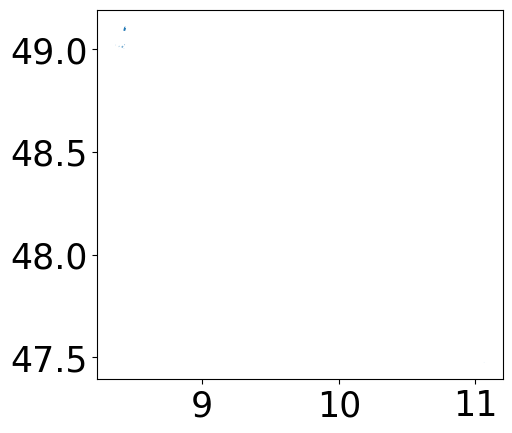

In [91]:
university.plot()

In [92]:
# find university counts in the grid
masks_university = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = university.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_university.append(pip_mask)

#university counts to the dataframe
university_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    university_count.append(university[masks_university[i]].shape[0])

berlin_polyframe_lat_long_new['university_count'] = university_count


100%|██████████| 822/822 [00:00<00:00, 1907.74it/s]


##### School

In [93]:
school = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "school"},
)
school.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-school.csv")
school.head()

amenity                      name wheelchair  \
element_type osmid                                                   
node         25929965  school               Tullaschule         no   
             26940026  school        Oberwaldschule Aue        NaN   
             29847215  school    Friedrich-Ebert-Schule        NaN   
             29847217  school  Elisabeth-Selbert-Schule        NaN   
             60247322  school                 Südschule        NaN   

                                       geometry  addr:city addr:housenumber  \
element_type osmid                                                            
node         25929965  POINT (8.43233 49.00929)        NaN              NaN   
             26940026  POINT (8.45431 48.99197)  Karlsruhe               25   
             29847215  POINT (8.36356 49.00856)        NaN              NaN   
             29847217  POINT (8.38334 48.99717)        NaN              NaN   
             60247322  POINT (8.37146 49.04590)        NaN              NaN   

                      addr:postcode    addr:street  \
element_type osmid                                   
node         25929965           NaN            NaN   
             26940026         76227  Grazer Straße   
             29847215           NaN            NaN   
             29847217           NaN            NaN   
             60247322           NaN            NaN   

                                          alt_name  \
element_type osmid                                   
node         25929965                          NaN   
             26940026                          NaN   
             29847215  Friedrich-Ebert-Grundschule   
             29847217                          NaN   
             60247322                          NaN   

                                                           contact:email  ...  \
element_type osmid                                                        ...   
node         25929965                                                NaN  ...   
             26940026                                                NaN  ...   
             29847215  poststelle@friedrich-ebert-schule-ka.schule.bw...  ...   
             29847217                                                NaN  ...   
             60247322                                                NaN  ...   

                      name:en name:fr capacity official_name landuse  \
element_type osmid                                                     
node         25929965     NaN     NaN      NaN           NaN     NaN   
             26940026     NaN     NaN      NaN           NaN     NaN   
             29847215     NaN     NaN      NaN           NaN     NaN   
             29847217     NaN     NaN      NaN           NaN     NaN   
             60247322     NaN     NaN      NaN           NaN     NaN   

                      short_name source:geometry opening_hours ways type  
element_type osmid                                                        
node         25929965        NaN             NaN           NaN  NaN  NaN  
             26940026        NaN             NaN           NaN  NaN  NaN  
             29847215        NaN             NaN           NaN  NaN  NaN  
             29847217        NaN             NaN           NaN  NaN  NaN  
             60247322        NaN             NaN           NaN  NaN  NaN  

[5 rows x 58 columns]

<Axes: >

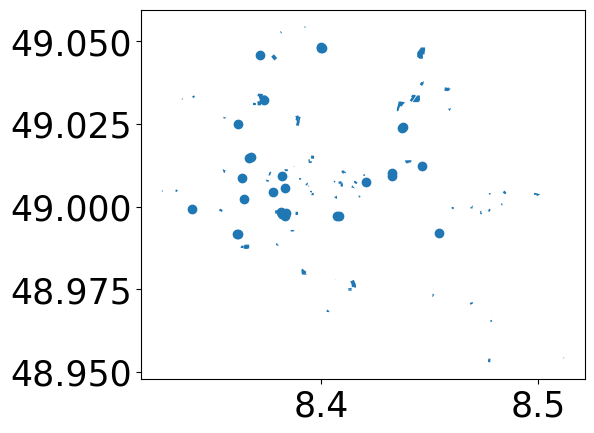

In [94]:
school.plot()

In [95]:
# find school counts in the grid
masks_school = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = school.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_school.append(pip_mask)

#school counts to the dataframe
school_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    school_count.append(school[masks_school[i]].shape[0])

berlin_polyframe_lat_long_new['school_count'] = school_count


100%|██████████| 822/822 [00:00<00:00, 1852.41it/s]


##### Leisure = park

In [96]:
park = ox.geometries_from_place(
    PLACE_NAME,
    {"leisure": "park"},
)

park.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-park.csv")
park.head()


foot opening_hours wheelchair  \
element_type osmid                                   
way          4050961  NaN           NaN        NaN   
             4051008  NaN           NaN        NaN   
             4051011  NaN           NaN        NaN   
             4051241  NaN           NaN        NaN   
             4051926  NaN           NaN        NaN   

                                                               geometry  \
element_type osmid                                                        
way          4050961  POLYGON ((8.41369 49.00319, 8.41364 49.00307, ...   
             4051008  POLYGON ((8.40775 49.00016, 8.40624 49.00012, ...   
             4051011  POLYGON ((8.41011 48.99994, 8.41010 49.00015, ...   
             4051241  POLYGON ((8.41203 49.00154, 8.41176 49.00153, ...   
             4051926  POLYGON ((8.41198 49.00038, 8.41196 49.00088, ...   

                     source access name opening_hours:covid19 description  \
element_type osmid                                                          
way          4050961    NaN    NaN  NaN                   NaN         NaN   
             4051008  LA-KA    NaN  NaN                   NaN         NaN   
             4051011    NaN    NaN  NaN                   NaN         NaN   
             4051241  LA-KA    NaN  NaN                   NaN         NaN   
             4051926  LA-KA    NaN  NaN                   NaN         NaN   

                     note  ... fuel:electric fuel:gas fuel:wood place name:sk  \
element_type osmid         ...                                                  
way          4050961  NaN  ...           NaN      NaN       NaN   NaN     NaN   
             4051008  NaN  ...           NaN      NaN       NaN   NaN     NaN   
             4051011  NaN  ...           NaN      NaN       NaN   NaN     NaN   
             4051241  NaN  ...           NaN      NaN       NaN   NaN     NaN   
             4051926  NaN  ...           NaN      NaN       NaN   NaN     NaN   

                     notes addr:housenumber addr:street ways type  
element_type osmid                                                 
way          4050961   NaN              NaN         NaN  NaN  NaN  
             4051008   NaN              NaN         NaN  NaN  NaN  
             4051011   NaN              NaN         NaN  NaN  NaN  
             4051241   NaN              NaN         NaN  NaN  NaN  
             4051926   NaN              NaN         NaN  NaN  NaN  

[5 rows x 59 columns]

/tmp/ipykernel_26961/636914825.py:11: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(['park', 'EV stations'])


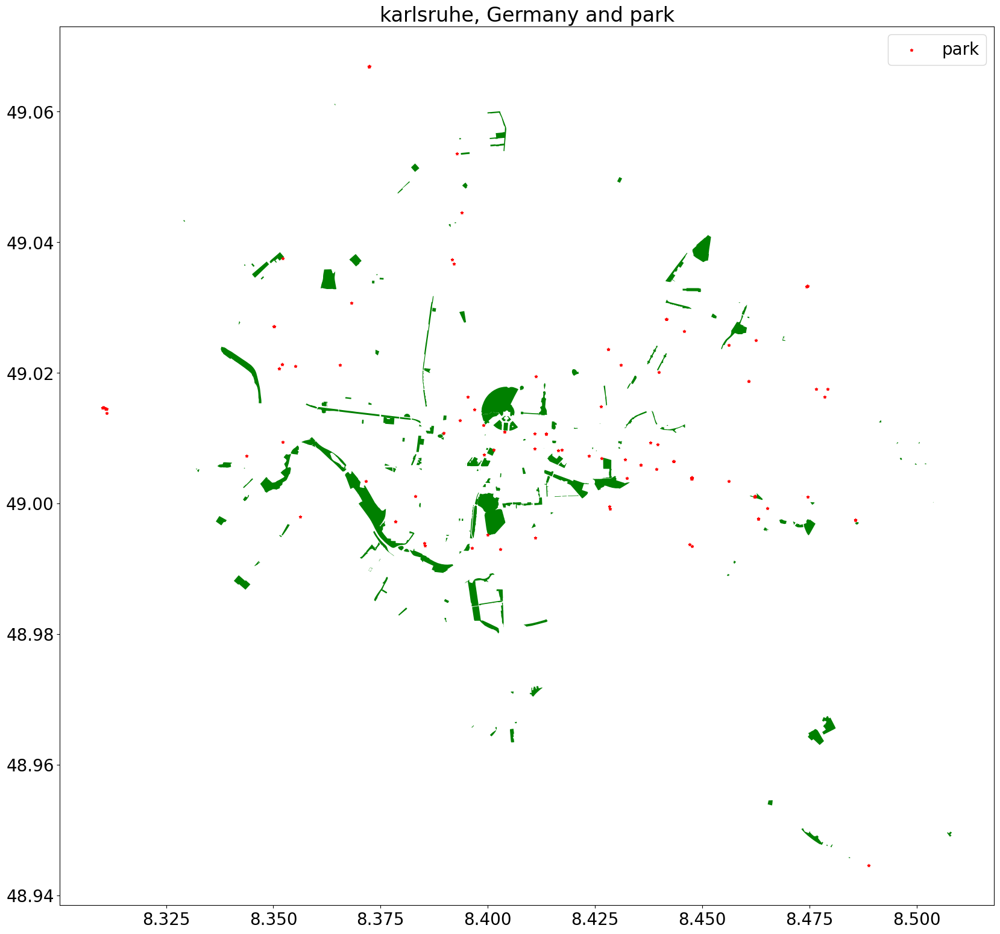

In [97]:
#plot the park data 

plt.rcParams.update({'font.size':20})
fig, ax = plt.subplots(figsize=(20,20))
park.plot(ax=ax, legend=False, color='green')
plt.title(f'{PLACE_NAME} and park')

# add EV stations
EV_stations.plot(ax=ax, color='red', markersize=10, marker='*', label='EV stations')
# add legend
plt.legend(['park', 'EV stations'])

In [98]:
# find park counts in the grid
masks_park = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = park.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_park.append(pip_mask)

#park counts to the dataframe
park_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    park_count.append(park[masks_park[i]].shape[0])

berlin_polyframe_lat_long_new['park_count'] = park_count

100%|██████████| 822/822 [00:00<00:00, 1748.03it/s]


##### Leisure = Cinema

In [99]:
cinema = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "cinema"},
)
cinema.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-cinema.csv")
cinema.head()

addr:city addr:country addr:housenumber  \
element_type osmid                                                 
node         30969562    Karlsruhe           DE          152-154   
             30969701    Karlsruhe          NaN                6   
             4063334889  Karlsruhe          NaN               16   
way          326808442   Karlsruhe           DE               40   

                        addr:postcode    addr:street air_conditioning amenity  \
element_type osmid                                                              
node         30969562           76133   Kaiserstraße              yes  cinema   
             30969701           76133  Kaiserpassage              NaN  cinema   
             4063334889         76137   Marienstraße              NaN  cinema   
way          326808442          76135   Brauerstraße              NaN  cinema   

                        cinema:3D cinema:HFR             contact:website  ...  \
element_type osmid                                                        ...   
node         30969562         yes        yes  http://www.kinopolis.de/ka  ...   
             30969701          no        NaN                         NaN  ...   
             4063334889       NaN        NaN                         NaN  ...   
way          326808442        NaN        NaN  http://www.filmpalast.net/  ...   

                                                                  geometry  \
element_type osmid                                                           
node         30969562                             POINT (8.39426 49.01017)   
             30969701                             POINT (8.39686 49.01056)   
             4063334889                           POINT (8.40781 49.00324)   
way          326808442   POLYGON ((8.38565 49.00071, 8.38565 49.00070, ...   

                        operator:type                      website  \
element_type osmid                                                   
node         30969562             NaN                          NaN   
             30969701     cooperative  www.kinemathek-karlsruhe.de   
             4063334889           NaN     http://www.schauburg.de/   
way          326808442            NaN                          NaN   

                                            wheelchair:description  \
element_type osmid                                                   
node         30969562                                          NaN   
             30969701                                          NaN   
             4063334889                     Zugang durch Hinterhof   
way          326808442   Behindertentoilette in der obersten Etage   

                                        wikipedia  \
element_type osmid                                  
node         30969562                         NaN   
             30969701                         NaN   
             4063334889  de:Schauburg (Karlsruhe)   
way          326808442                        NaN   

                                                                     nodes  \
element_type osmid                                                           
node         30969562                                                  NaN   
             30969701                                                  NaN   
             4063334889                                                NaN   
way          326808442   [1615805464, 1615805462, 1614904537, 161490454...   

                         check_date cinema:imax    contact:phone start_date  
element_type osmid                                                           
node         30969562           NaN         NaN              NaN        NaN  
             30969701           NaN         NaN              NaN        NaN  
             4063334889         NaN         NaN              NaN        NaN  
way          326808442   2022-12-28         yes  +49 721 2059201    2000-03  

[4 rows x 39 columns]

<Axes: >

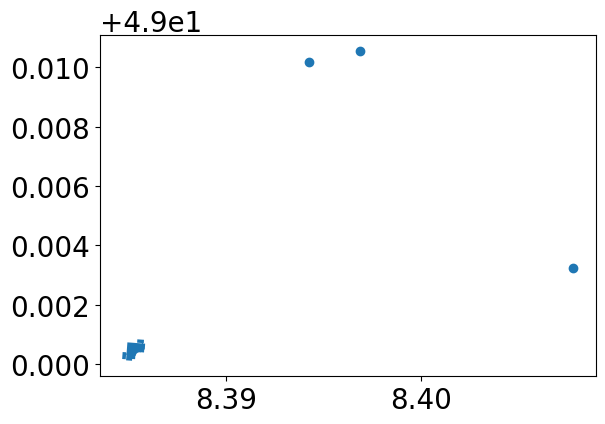

In [100]:
cinema.plot()

In [101]:
# find cinema counts in the grid
masks_cinema = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = cinema.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_cinema.append(pip_mask)

#cinema counts to the dataframe
cinema_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    cinema_count.append(cinema[masks_cinema[i]].shape[0])

100%|██████████| 822/822 [00:00<00:00, 1774.38it/s]


##### Townhall

In [102]:
townhall = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "townhall"},
)
townhall.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-townhall.csv")
townhall.head()

geometry  \
element_type osmid                                                            
node         3296373434                            POINT (8.48262 48.94708)   
             10814836788                           POINT (8.49596 49.00711)   
             10814841781                           POINT (8.49666 49.00751)   
way          8084888      POLYGON ((8.37976 49.05241, 8.37974 49.05241, ...   
             25000999     POLYGON ((8.47123 48.99899, 8.47124 48.99916, ...   

                           amenity  \
element_type osmid                   
node         3296373434   townhall   
             10814836788  townhall   
             10814841781  townhall   
way          8084888      townhall   
             25000999     townhall   

                                                                     name  \
element_type osmid                                                          
node         3296373434                                  Rathaus Palmbach   
             10814836788              Rathaus 2 (Service- und Bürgerbüro)   
             10814841781  Rathaus 3 (Bauamt, Friedhofsverwaltung, Bauhof)   
way          8084888                                      Rathaus Neureut   
             25000999                                     Rathaus Durlach   

                          addr:city addr:housenumber addr:postcode  \
element_type osmid                                                   
node         3296373434         NaN              NaN           NaN   
             10814836788  Karlsruhe                2         76229   
             10814841781  Karlsruhe                2         76229   
way          8084888      Karlsruhe              145         76149   
             25000999     Karlsruhe               33         76227   

                              addr:street  \
element_type osmid                          
node         3296373434               NaN   
             10814836788     Rathausplatz   
             10814841781     Rathausgasse   
way          8084888      Kirchfeldstraße   
             25000999      Pfinztalstraße   

                                                          email  \
element_type osmid                                                
node         3296373434                                     NaN   
             10814836788  buergerbuero@groetzingen.karlsruhe.de   
             10814841781                                    NaN   
way          8084888                                        NaN   
             25000999                                       NaN   

                                                              opening_hours  \
element_type osmid                                                            
node         3296373434                                                 NaN   
             10814836788               Mo-We,Fr 08:00-12:00; Th 13:30-18:00   
             10814841781                                   "by appointment"   
way          8084888                                                    NaN   
             25000999     Mo 08:00-15:00; Tu,We,Fr 08:00-12:00; Th 14:00...   

                                                            operator  ...  \
element_type osmid                                                    ...   
node         3296373434                                          NaN  ...   
             10814836788  Stadt Karlsruhe, Ortsverwaltun gGrötzingen  ...   
             10814841781  Stadt Karlsruhe, Ortsverwaltung Grötzingen  ...   
way          8084888                                             NaN  ...   
             25000999                                            NaN  ...   

                         building:colour building:levels last_renovation  \
element_type osmid                                                         
node         3296373434              NaN             NaN             NaN   
             10814836788             NaN             NaN             NaN   
             10814841781       

<Axes: >

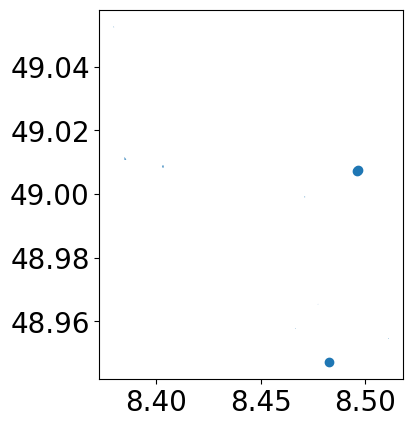

In [103]:
townhall.plot()

In [104]:
# find townhall counts in the grid
masks_townhall = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = townhall.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_townhall.append(pip_mask)

#townhall counts to the dataframe
townhall_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    townhall_count.append(townhall[masks_townhall[i]].shape[0])

berlin_polyframe_lat_long_new['townhall_count'] = townhall_count


100%|██████████| 822/822 [00:00<00:00, 1778.11it/s]


##### Community_centre

In [105]:
Community_centre = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "community_centre"},
)
Community_centre.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-Community_centre.csv")
Community_centre.head()

amenity  \
element_type osmid                         
node         25508395   community_centre   
             27560527   community_centre   
             261012765  community_centre   
             454972657  community_centre   
             739503354  community_centre   

                                                               name  \
element_type osmid                                                    
node         25508395                                    s'Dorfkind   
             27560527   Katholisches Gemeindezentrum Sankt Matthias   
             261012765       Christkönighaus - Sankt Peter und Paul   
             454972657                                        ßpace   
             739503354                evangelisches Gemeindezentrum   

                                          website wheelchair  \
element_type osmid                                             
node         25508395   https://www.sdorfkind.de/         no   
             27560527                         NaN        NaN   
             261012765                        NaN        yes   
             454972657                        NaN    limited   
             739503354                        NaN         no   

                                        geometry    denomination   religion  \
element_type osmid                                                            
node         25508395   POINT (8.51086 48.95409)             NaN        NaN   
             27560527   POINT (8.37174 49.03435)  roman_catholic  christian   
             261012765  POINT (8.46786 48.99798)             NaN        NaN   
             454972657  POINT (8.41045 49.00836)             NaN        NaN   
             739503354  POINT (8.45447 48.97708)             NaN        NaN   

                        addr:city addr:country addr:housenumber  ...  \
element_type osmid                                               ...   
node         25508395         NaN          NaN              NaN  ...   
             27560527         NaN          NaN              NaN  ...   
             261012765  Karlsruhe           DE                5  ...   
             454972657  Karlsruhe          NaN                7  ...   
             739503354  Karlsruhe          NaN              NaN  ...   

                       old_operator addr:subdistrict roof:material  \
element_type osmid                                                   
node         25508395           NaN              NaN           NaN   
             27560527           NaN              NaN           NaN   
             261012765          NaN              NaN           NaN   
             454972657          NaN              NaN           NaN   
             739503354          NaN              NaN           NaN   

                       building:material roof:colour polling_station office  \
element_type osmid                                                            
node         25508395                NaN         NaN             NaN    NaN   
             27560527                NaN         NaN             NaN    NaN   
             261012765               NaN         NaN             NaN    NaN   
             454972657               NaN         NaN             NaN    NaN   
             739503354               NaN         NaN             NaN    NaN   

                       architect ways type  
element_type osmid                          
node         25508395        NaN  NaN  NaN  
             27560527        NaN  NaN  NaN  
             261012765       NaN  NaN  NaN  
             454972657       NaN  NaN  NaN  
             739503354       NaN  NaN  NaN  

[5 rows x 79 columns]

In [106]:
# find Community_centre counts in the grid
masks_Community_centre = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = Community_centre.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_Community_centre.append(pip_mask)

#Community_centre counts to the dataframe
Community_centre_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    Community_centre_count.append(Community_centre[masks_Community_centre[i]].shape[0])

100%|██████████| 822/822 [00:00<00:00, 1785.77it/s]


In [107]:
berlin_polyframe_lat_long_new['Community_centre_count'] = Community_centre_count

##### Building = Geovenment 

In [108]:
government = ox.geometries_from_place(
    PLACE_NAME,
    {"building": "government"},
)

government.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-government_building.csv")
government.head()

geometry  \
element_type osmid                                                         
way          22927285  POLYGON ((8.47360 48.99745, 8.47374 48.99699, ...   
             23404645  POLYGON ((8.39814 49.00787, 8.39831 49.00782, ...   
             25000999  POLYGON ((8.47123 48.99899, 8.47124 48.99916, ...   
             51014819  POLYGON ((8.42571 49.01386, 8.42565 49.01422, ...   
             90181934  POLYGON ((8.40391 49.00800, 8.40389 49.00800, ...   

                                                                   image  \
element_type osmid                                                         
way          22927285                                                NaN   
             23404645                                                NaN   
             25000999                                                NaN   
             51014819                                                NaN   
             90181934  https://commons.wikimedia.org/wiki/File:Gro%C3...   

                                              name  \
element_type osmid                                   
way          22927285  Finanzamt Karlsruhe-Durlach   
             23404645                          NaN   
             25000999              Rathaus Durlach   
             51014819                          NaN   
             90181934                          NaN   

                                                                   nodes  \
element_type osmid                                                         
way          22927285  [246879297, 246879298, 246879299, 246879300, 2...   
             23404645  [253395566, 5122128186, 253395567, 253395568, ...   
             25000999  [271787515, 271787516, 271787517, 271787518, 2...   
             51014819  [650487061, 650487124, 650487113, 650487115, 3...   
             90181934  [8090516691, 1045525216, 1045525189, 172963070...   

                       addr:city addr:housenumber addr:postcode  \
element_type osmid                                                
way          22927285  Karlsruhe                2         76227   
             23404645  Karlsruhe               2a         76133   
             25000999  Karlsruhe               33         76227   
             51014819        NaN              NaN           NaN   
             90181934        NaN              NaN           NaN   

                            addr:street    building  \
element_type osmid                                    
way          22927285  Prinzessenstraße  government   
             23404645      Blumenstraße  government   
             25000999    Pfinztalstraße  government   
             51014819               NaN  government   
             90181934               NaN  government   

                                                        email  ...  \
element_type osmid                                             ...   
way          22927285  poststelle@fa-karlsruhe-durlach.bwl.de  ...   
             23404645                                     NaN  ...   
             25000999                                     NaN  ...   
             51014819                                     NaN  ...   
             90181934                                     NaN  ...   

                      heritage:operator building:material roof:material  \
element_type osmid                                                        
way          22927285               NaN               NaN           NaN   
             23404645               NaN               NaN           NaN   
             25000999               NaN               NaN           NaN   
             51014819               NaN               NaN           NaN   
             90181934               NaN               NaN           NaN   

                      addr:suburb source construction:start_date wikidata  \
element_type osmid                                                          
way          22927285         NaN    NaN                   

<Axes: >

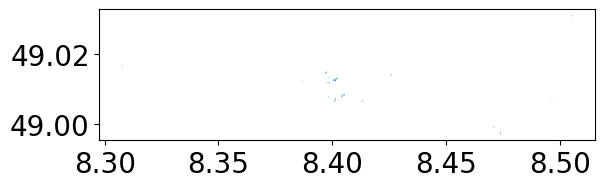

In [109]:
government.plot()

In [110]:
# find government counts in the grid
masks_government = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = government.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_government.append(pip_mask)

#government counts to the dataframe
government_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    government_count.append(government[masks_government[i]].shape[0])

berlin_polyframe_lat_long_new['government_count'] = government_count


100%|██████████| 822/822 [00:00<00:00, 1923.26it/s]


##### Building=civic 

In [111]:
civic = ox.geometries_from_place(
    PLACE_NAME,
    {"building": "civic"},
)

civic.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-civic_building.csv")
civic.head()

geometry  \
element_type osmid                                                         
way          4234637   POLYGON ((8.39909 49.00733, 8.39840 49.00754, ...   
             7652212   POLYGON ((8.38355 49.04446, 8.38338 49.04436, ...   
             15526553  POLYGON ((8.40402 49.01269, 8.40401 49.01257, ...   
             15526557  POLYGON ((8.39973 49.00288, 8.39972 49.00285, ...   
             15526562  POLYGON ((8.40444 49.01267, 8.40443 49.01263, ...   

                      historic                       name wheelchair  \
element_type osmid                                                     
way          4234637       NaN  Badische Landesbibliothek        yes   
             7652212       NaN            Badnerlandhalle        NaN   
             15526553      NaN                        NaN        NaN   
             15526557      NaN                Konzerthaus        NaN   
             15526562      NaN                        NaN        NaN   

                                                                  source  \
element_type osmid                                                         
way          4234637   http://www.blb-karlsruhe.de/blb/blbhtml/org/im...   
             7652212                                                 NaN   
             15526553                                                NaN   
             15526557                                                NaN   
             15526562                                                NaN   

                       addr:city addr:country addr:housenumber addr:postcode  \
element_type osmid                                                             
way          4234637   Karlsruhe           DE               15         76133   
             7652212   Karlsruhe           DE               21         76149   
             15526553        NaN          NaN              NaN           NaN   
             15526557  Karlsruhe           DE                9         76137   
             15526562        NaN          NaN              NaN           NaN   

                            addr:street  ... noaddress social_facility  \
element_type osmid                       ...                             
way          4234637   Erbprinzenstraße  ...       NaN             NaN   
             7652212       Rubensstraße  ...       NaN             NaN   
             15526553               NaN  ...       NaN             NaN   
             15526557         Festplatz  ...       NaN             NaN   
             15526562               NaN  ...       NaN             NaN   

                      social_facility:for temporary ways type disused:amenity  \
element_type osmid                                                              
way          4234637                  NaN       NaN  NaN  NaN             NaN   
             7652212                  NaN       NaN  NaN  NaN             NaN   
             15526553                 NaN       NaN  NaN  NaN             NaN   
             15526557                 NaN       NaN  NaN  NaN             NaN   
             15526562                 NaN       NaN  NaN  NaN             NaN   

                      club contact:fax official_name  
element_type osmid                                    
way          4234637   NaN         NaN           NaN  
             7652212   NaN         NaN           NaN  
             15526553  NaN         NaN           NaN  
             15526557  NaN         NaN           NaN  
             15526562  NaN         NaN           NaN  

[5 rows x 112 columns]

<Axes: >

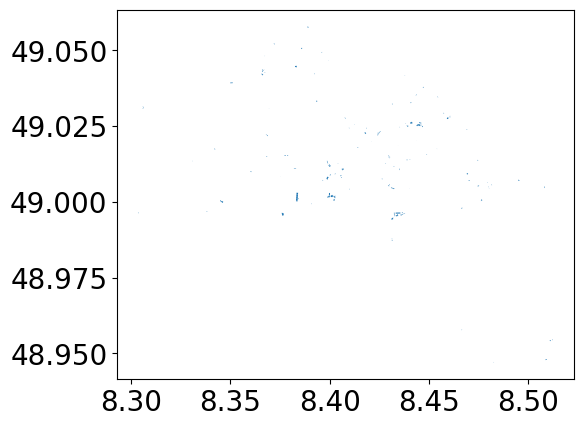

In [112]:
civic.plot()

In [113]:
# find civic counts in the grid
masks_civic = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = civic.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_civic.append(pip_mask)

#civic counts to the dataframe
civic_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    civic_count.append(civic[masks_civic[i]].shape[0])

berlin_polyframe_lat_long_new['civic_count'] = civic_count

100%|██████████| 822/822 [00:00<00:00, 1760.61it/s]


##### building=commercial

In [114]:
commercial = ox.geometries_from_place(
    PLACE_NAME,
    {"building": "commercial"},
)
commercial.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-commercial_building.csv")
commercial.head()


geometry  \
element_type osmid                                                         
way          23640542  POLYGON ((8.44456 49.00434, 8.44437 49.00438, ...   
             23981622  POLYGON ((8.37074 49.02923, 8.37074 49.02925, ...   
             24041489  POLYGON ((8.37404 49.02755, 8.37405 49.02765, ...   
             24408007  POLYGON ((8.37993 49.00622, 8.37973 49.00628, ...   
             29014793  POLYGON ((8.35715 49.00276, 8.35709 49.00260, ...   

                       name wheelchair amenity check_date operator  ref  \
element_type osmid                                                        
way          23640542   NaN        NaN     NaN        NaN      NaN  NaN   
             23981622   NaN        NaN     NaN        NaN      NaN  NaN   
             24041489   NaN    limited     NaN        NaN      NaN  NaN   
             24408007  Lidl        yes     NaN        NaN      NaN  NaN   
             29014793   NaN        NaN     NaN        NaN      NaN  NaN   

                       addr:city addr:country addr:housenumber  ... brewery  \
element_type osmid                                              ...           
way          23640542  Karlsruhe           DE              109  ...     NaN   
             23981622  Karlsruhe           DE               16  ...     NaN   
             24041489  Karlsruhe           DE                9  ...     NaN   
             24408007  Karlsruhe           DE              240  ...     NaN   
             29014793  Karlsruhe           DE               15  ...     NaN   

                      min_age opening_hours:signed payment:credit_cards  \
element_type osmid                                                        
way          23640542     NaN                  NaN                  NaN   
             23981622     NaN                  NaN                  NaN   
             24041489     NaN                  NaN                  NaN   
             24408007     NaN                  NaN                  NaN   
             29014793     NaN                  NaN                  NaN   

                      payment:debit_cards roof:direction construction  \
element_type osmid                                                      
way          23640542                 NaN            NaN          NaN   
             23981622                 NaN            NaN          NaN   
             24041489                 NaN            NaN          NaN   
             24408007                 NaN            NaN          NaN   
             29014793                 NaN            NaN          NaN   

                      opening_date ways type  
element_type osmid                            
way          23640542          NaN  NaN  NaN  
             23981622          NaN  NaN  NaN  
             24041489          NaN  NaN  NaN  
             24408007          NaN  NaN  NaN  
             29014793          NaN  NaN  NaN  

[5 rows x 126 columns]

<Axes: >

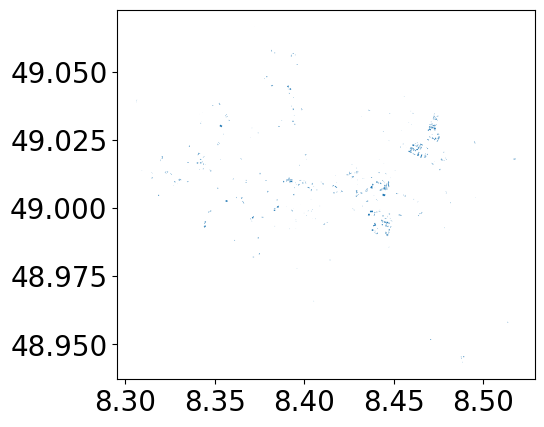

In [115]:
commercial.plot()

In [116]:
# find commercial counts in the grid
masks_commercial = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = commercial.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_commercial.append(pip_mask)

#commercial counts to the dataframe
commercial_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    commercial_count.append(commercial[masks_commercial[i]].shape[0])

berlin_polyframe_lat_long_new['commercial_count'] = commercial_count


100%|██████████| 822/822 [00:00<00:00, 1702.62it/s]


##### building = Retail stores

In [117]:
retail = ox.geometries_from_place(
    PLACE_NAME,
    {"building": "retail"},
)
retail.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-retail_building.csv")
retail.head()

geometry  \
element_type osmid                                                         
way          4546108   POLYGON ((8.37890 49.01018, 8.37892 49.01018, ...   
             22890616  POLYGON ((8.40134 49.00629, 8.40132 49.00632, ...   
             23274176  POLYGON ((8.47300 48.99805, 8.47300 48.99804, ...   
             23528417  POLYGON ((8.37619 48.99095, 8.37615 48.99092, ...   
             24011620  POLYGON ((8.37417 49.02270, 8.37411 49.02273, ...   

                      wheelchair amenity           name cuisine  \
element_type osmid                                                
way          4546108         yes     NaN      CAP-Markt     NaN   
             22890616        yes     NaN  Ettlinger Tor     NaN   
             23274176        NaN     NaN            NaN     NaN   
             23528417        yes     NaN            NaN     NaN   
             24011620        NaN     NaN            NaN     NaN   

                      diet:vegetarian                 opening_hours brand  \
element_type osmid                                                          
way          4546108              NaN     Mo-Sa 08:00-20:00; PH off   CAP   
             22890616             NaN  Mo-Sa 08:00-20:00; Su,PH off   NaN   
             23274176             NaN                           NaN   NaN   
             23528417             NaN                           NaN   NaN   
             24011620             NaN                           NaN   NaN   

                      height                                    operator  ...  \
element_type osmid                                                        ...   
way          4546108     NaN  BZKA Beschäftigungszentrum Karlsruhe gGmbH  ...   
             22890616    NaN         ECE Projektmanagement GmbH & Co. KG  ...   
             23274176    NaN                                         NaN  ...   
             23528417    NaN                                         NaN  ...   
             24011620    NaN                                         NaN  ...   

                      supermarket  dog payment:contactless payment:mastercard  \
element_type osmid                                                              
way          4546108          NaN  NaN                 NaN                NaN   
             22890616         NaN  NaN                 NaN                NaN   
             23274176         NaN  NaN                 NaN                NaN   
             23528417         NaN  NaN                 NaN                NaN   
             24011620         NaN  NaN                 NaN                NaN   

                      roof:direction roof:height service:bicycle:pump  \
element_type osmid                                                      
way          4546108             NaN         NaN                  NaN   
             22890616            NaN         NaN                  NaN   
             23274176            NaN         NaN                  NaN   
             23528417            NaN         NaN                  NaN   
             24011620            NaN         NaN                  NaN   

                      building:min_level ways type  
element_type osmid                                  
way          4546108                 NaN  NaN  NaN  
             22890616                NaN  NaN  NaN  
             23274176                NaN  NaN  NaN  
             23528417                NaN  NaN  NaN  
             24011620                NaN  NaN  NaN  

[5 rows x 129 columns]

<Axes: >

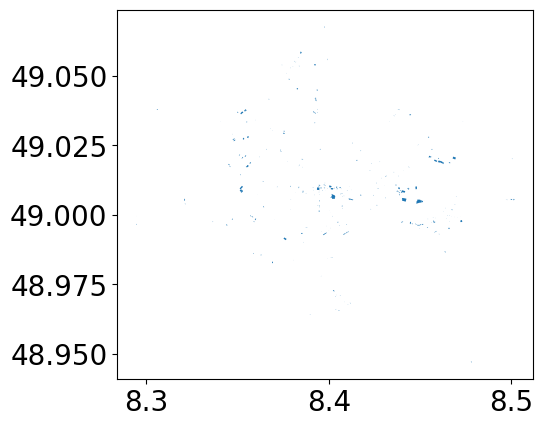

In [118]:
retail.plot()

In [119]:
# find retail counts in the grid
masks_retail = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = retail.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_retail.append(pip_mask)

#retail counts to the dataframe
retail_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    retail_count.append(retail[masks_retail[i]].shape[0])

berlin_polyframe_lat_long_new['retail_count'] = retail_count

100%|██████████| 822/822 [00:00<00:00, 1563.43it/s]


##### amenity=place_of_worship

In [120]:
place_of_worship = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "place_of_worship"},
)
place_of_worship.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-place_of_worship.csv")
place_of_worship.head()

geometry           amenity  \
element_type osmid                                                   
node         26942362   POINT (8.45622 48.99208)  place_of_worship   
             28416662   POINT (8.36384 48.98574)  place_of_worship   
             60253256   POINT (8.39914 48.99669)  place_of_worship   
             247266738  POINT (8.48192 48.94585)  place_of_worship   
             249173362  POINT (8.35440 49.01476)  place_of_worship   

                       denomination                     name   religion  \
element_type osmid                                                        
node         26942362      catholic  Sankt Johannes Baptista  christian   
             28416662    protestant  Ev. Versöhnungsgemeinde  christian   
             60253256           NaN           Menlha-Zentrum   buddhist   
             247266738          NaN          Waldenserkirche  christian   
             249173362          NaN         St. Antoniusheim  christian   

                        addr:city addr:housenumber addr:postcode  \
element_type osmid                                                 
node         26942362         NaN              NaN           NaN   
             28416662         NaN              NaN           NaN   
             60253256   Karlsruhe               36         76137   
             247266738        NaN              NaN           NaN   
             249173362  Karlsruhe              113         76185   

                          addr:street                 contact:email  ...  \
element_type osmid                                                   ...   
node         26942362             NaN                           NaN  ...   
             28416662             NaN                           NaN  ...   
             60253256   Bahnhofstraße  info@meditation-karlsruhe.de  ...   
             247266738            NaN                           NaN  ...   
             249173362    Rheinstraße                           NaN  ...   

                       old_owner owner building:part loc_name indoor name:de  \
element_type osmid                                                             
node         26942362        NaN   NaN           NaN      NaN    NaN     NaN   
             28416662        NaN   NaN           NaN      NaN    NaN     NaN   
             60253256        NaN   NaN           NaN      NaN    NaN     NaN   
             247266738       NaN   NaN           NaN      NaN    NaN     NaN   
             249173362       NaN   NaN           NaN      NaN    NaN     NaN   

                        ref room ways type  
element_type osmid                          
node         26942362   NaN  NaN  NaN  NaN  
             28416662   NaN  NaN  NaN  NaN  
             60253256   NaN  NaN  NaN  NaN  
             247266738  NaN  NaN  NaN  NaN  
             249173362  NaN  NaN  NaN  NaN  

[5 rows x 87 columns]

<Axes: >

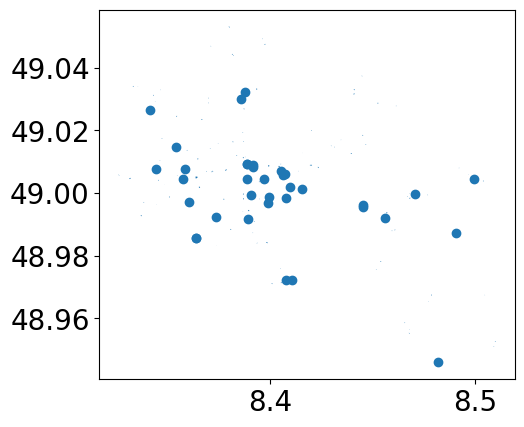

In [121]:
place_of_worship.plot()

In [122]:
# find place_of_worship counts in the grid
masks_place_of_worship = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = place_of_worship.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_place_of_worship.append(pip_mask)

#place_of_worship counts to the dataframe
place_of_worship_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    place_of_worship_count.append(place_of_worship[masks_place_of_worship[i]].shape[0])

berlin_polyframe_lat_long_new['place_of_worship_count'] = place_of_worship_count


100%|██████████| 822/822 [00:00<00:00, 1756.75it/s]


#### Detailed CSV SAVE

In [123]:
# save the dataframe
berlin_polyframe_lat_long_new.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/processed/{name}_data_detailed.csv")